In [1]:
import os
import pandas as pd
from PIL import Image
import torch
import torchvision.transforms as T
import torch.nn.functional as F


# import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid
import random

In [9]:
ll = []
for i in range(10):

    t = torch.Tensor([i])
    ll.append(i)

print(torch.Tensor(ll))
print(torch.Tensor(ll).mean())

tensor([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.])
tensor(4.5000)


In [2]:

from dataclasses import dataclass
import matplotlib.pyplot as plt
from accelerate import Accelerator
from tqdm.auto import tqdm
from pathlib import Path
import os
from diffusers import DDPMPipeline
import math
import os
from diffusers.optimization import get_cosine_schedule_with_warmup
import torch
from diffusers import UNet2DModel
from torchvision import transforms
import random 

import numpy as np

from PIL import Image
import torch.nn.functional as F
from diffusers import DDPMScheduler
from torch.utils.data import DataLoader
import pandas as pd
from torch.utils.data import Dataset
from torch import nn

import torchvision.transforms as T
from diffusers import UNet2DConditionModel
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid

/home/MichalMo/anaconda3/envs/SD1/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [34]:
import numpy as np

d = np.arange(2,359,2)
c = random.sample(sorted(d), 16)
c

[np.int64(78),
 np.int64(168),
 np.int64(104),
 np.int64(198),
 np.int64(330),
 np.int64(6),
 np.int64(302),
 np.int64(290),
 np.int64(300),
 np.int64(292),
 np.int64(36),
 np.int64(280),
 np.int64(182),
 np.int64(356),
 np.int64(314),
 np.int64(166)]

 gradient_circle_358.png,  MSE: 0.000022


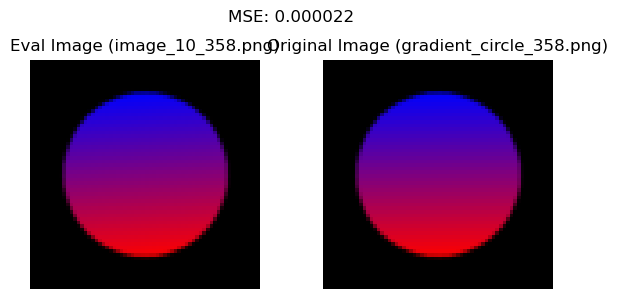

 gradient_circle_80.png,  MSE: 0.000089


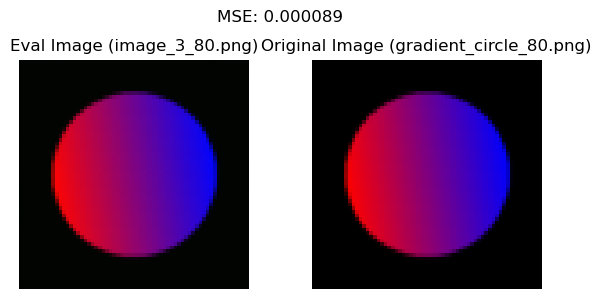

 gradient_circle_96.png,  MSE: 0.000075


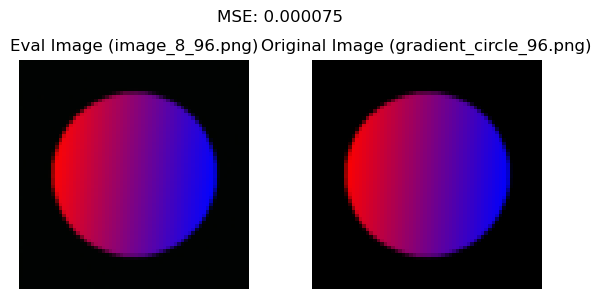

 gradient_circle_198.png,  MSE: 0.000005


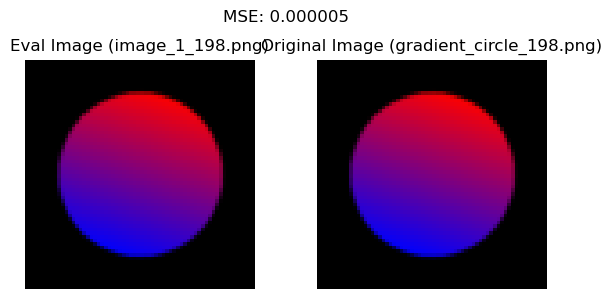

 gradient_circle_250.png,  MSE: 0.000009


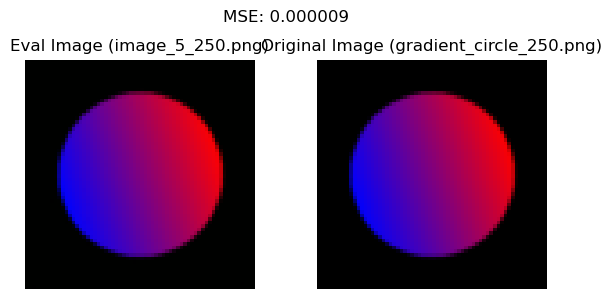

 gradient_circle_240.png,  MSE: 0.000024


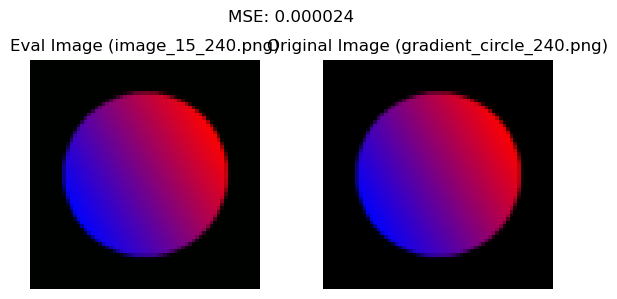

 gradient_circle_178.png,  MSE: 0.000002


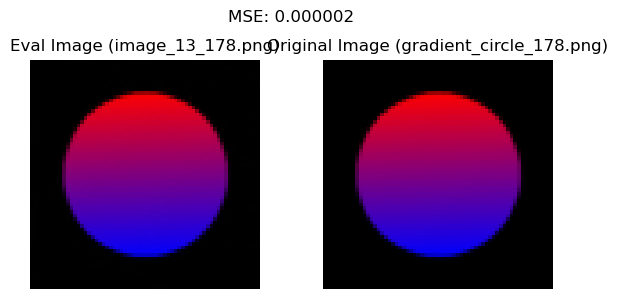

 gradient_circle_190.png,  MSE: 0.000005


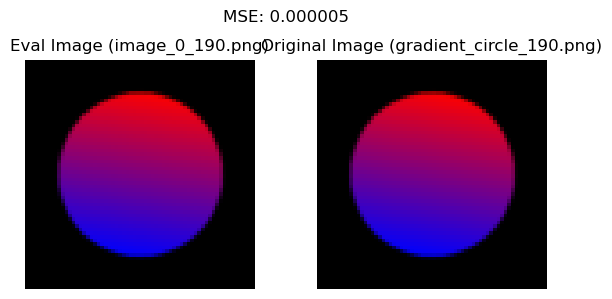

 gradient_circle_26.png,  MSE: 0.000007


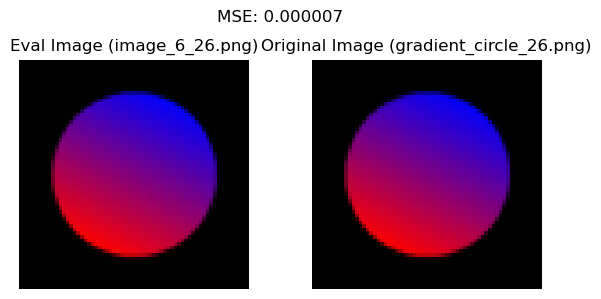

 gradient_circle_200.png,  MSE: 0.000007


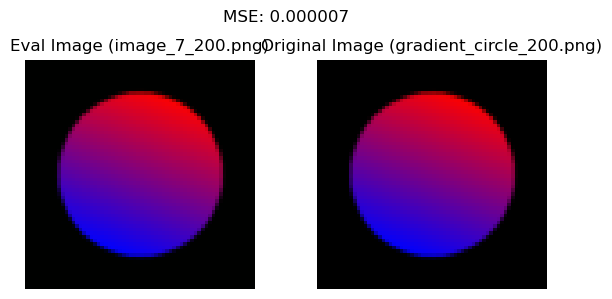

 gradient_circle_226.png,  MSE: 0.000006


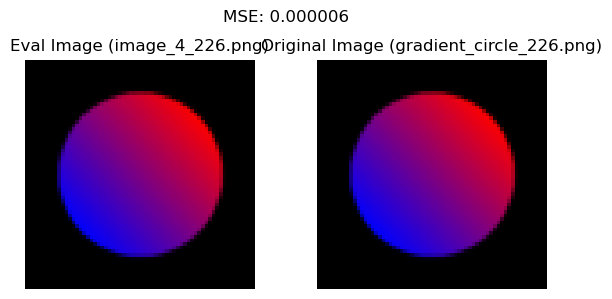

 gradient_circle_316.png,  MSE: 0.000039


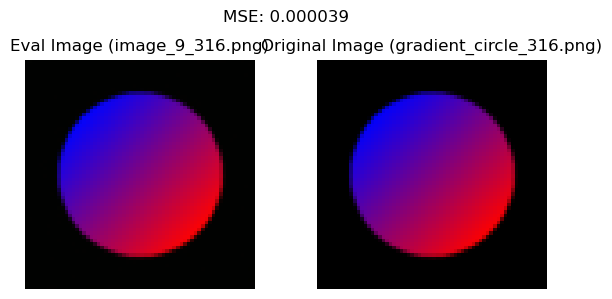

 gradient_circle_286.png,  MSE: 0.000007


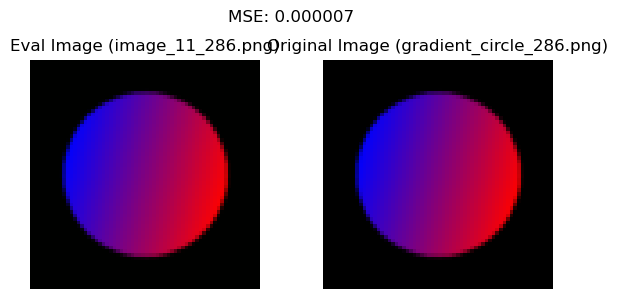

 gradient_circle_158.png,  MSE: 0.000014


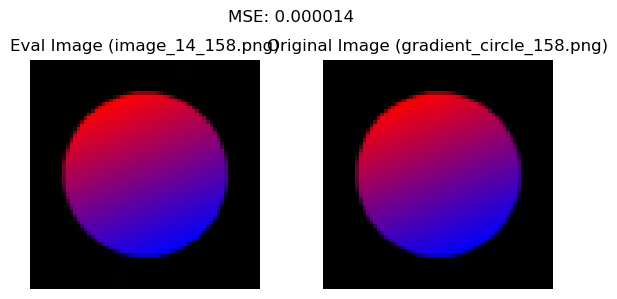

 gradient_circle_168.png,  MSE: 0.000002


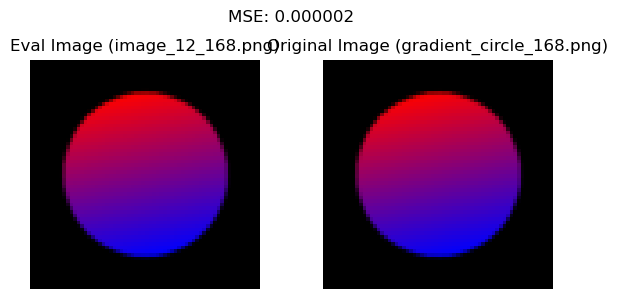

 gradient_circle_166.png,  MSE: 0.000033


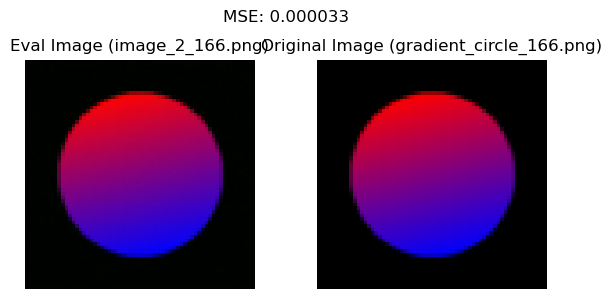

In [9]:

def my_make_grid(images, rows, cols):
    # w, h = images[0,0,:,:].size
    # w=64
    # h=64
    # grid = Image.new("RGB", size=(cols * w, rows * h))
    # for i, image in enumerate(images):
    #     grid.paste(image, box=(i % cols * w, i // cols * h))
    # return grid

    grid = make_grid(images, nrow=3, padding=2, normalize=True)

    # Convert to RGB PIL image
    grid_pil = to_pil_image(grid)
    return grid_pil


# === Paths ===
csv_path = "data/labels.csv"
eval_images_dir = "show_results4_vec_pipe_step9"
original_images_dir = "data/images"


# === Load CSV ===
df = pd.read_csv(csv_path)

# === Image Transform ===
to_tensor = T.ToTensor()  # Converts PIL image to [0,1] float tensor
to_pil = T.ToPILImage()


# === Comparison Metric: Mean Squared Error ===
def mse(img1, img2):
    return F.mse_loss(img1, img2).item()


eval_images = []
original_images = []



# === Iterate over small images ===
for filename in os.listdir(eval_images_dir):
    if filename.startswith("image_") and filename.endswith(".png"):
        # Extract X from "image_X.png"
        x_value = filename.split("_")[2].split(".")[0]
        # print(x_value)
        # Find corresponding original filename from CSV
        match = df[df["x"].astype(str) == x_value]

        if match.empty:
            print(f"No match found in CSV for x={x_value}")
            continue

        original_filename = match.iloc[0]["filename"]
        small_img_path = os.path.join(eval_images_dir, filename)
        original_img_path = os.path.join(original_images_dir, original_filename)

        # Load images
        try:
            eval_img = to_tensor(Image.open(small_img_path).convert("RGB"))
            original_img = to_tensor(Image.open(original_img_path).convert("RGB"))

            # Resize original to match small image size (if needed)
            if original_img.shape != eval_img.shape:
                original_img = T.Resize(eval_img.shape[1:])(original_img)

            # print(eval_img.shape, original_img.shape)

            # Compute MSE
            error = mse(eval_img, original_img)
            print(f" {original_filename},  MSE: {error:.6f}")


            eval_images.append(eval_img)
            original_images.append(original_img)

            
            # plt.figure(figsize = (12,6))
            # plt.subplot(121)
            # plt.imshow()

            fig, axes = plt.subplots(1, 2, figsize=(6, 3))
            axes[0].imshow(to_pil(eval_img))
            axes[0].set_title(f"Eval Image ({filename})")
            axes[0].axis("off")

            axes[1].imshow(to_pil(original_img))
            axes[1].set_title(f"Original Image ({original_filename})")
            axes[1].axis("off")

            plt.suptitle(f"MSE: {error:.6f}")
            plt.tight_layout()
            plt.show()


        # image_grid = my_make_grid(original_images,rows=4, cols=4)


        except Exception as e:
            print(f"Error processing {filename}: {e}")


if eval_images and original_images:
    grid_eval = make_grid(eval_images, nrow=4, padding=4)
    grid_original = make_grid(original_images, nrow=4, padding=4)

    grid_eval = to_pil_image(grid_eval)
    grid_original = to_pil_image(grid_original)

    # grid_eval.save(f"grid_eval.png")
    # grid_original.save(f"grid_original.png")
 

358


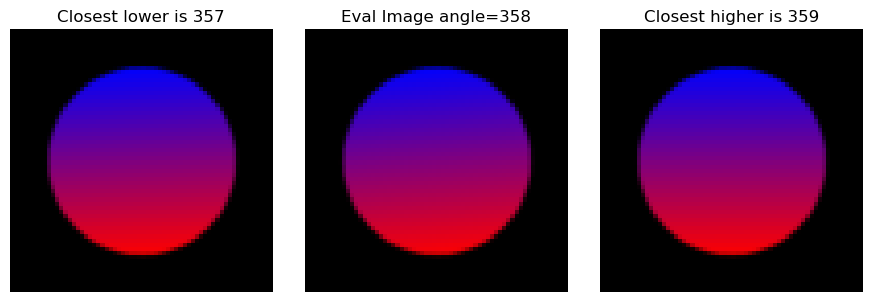

80


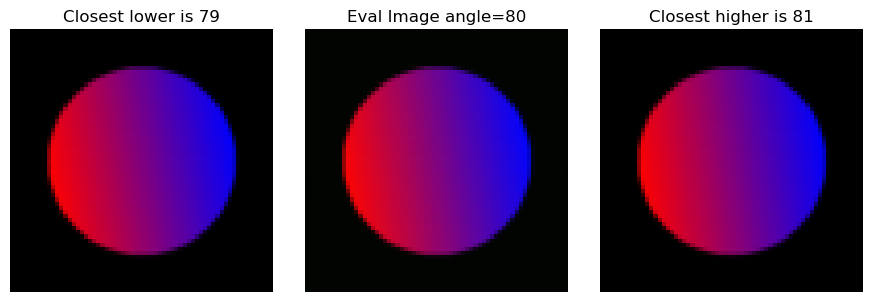

96


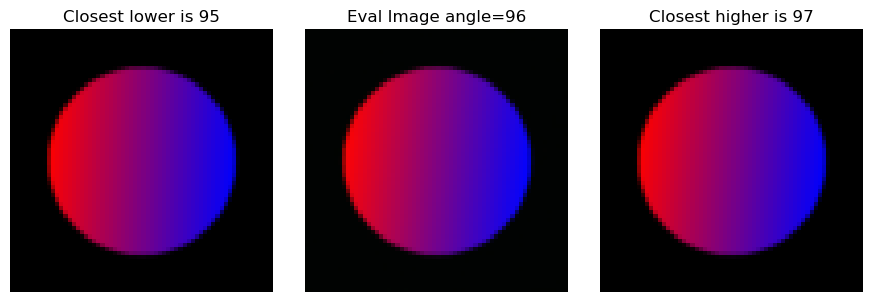

198


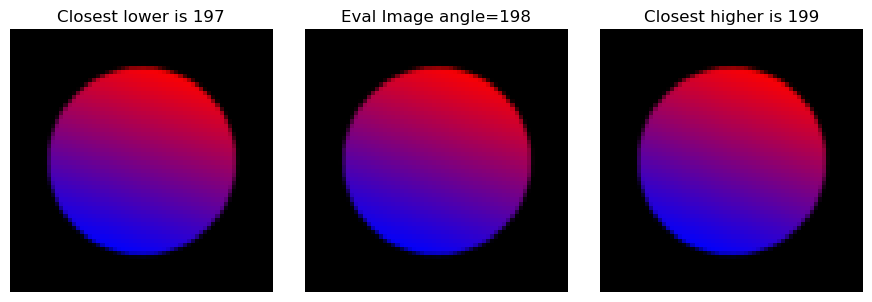

250


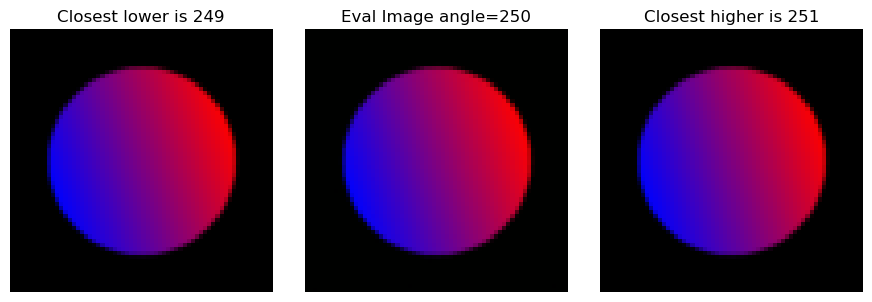

240


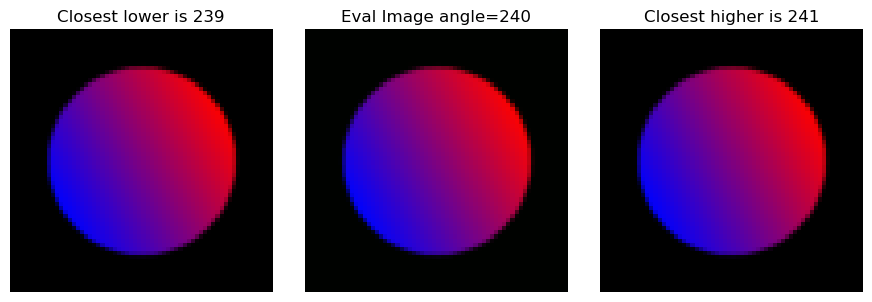

178


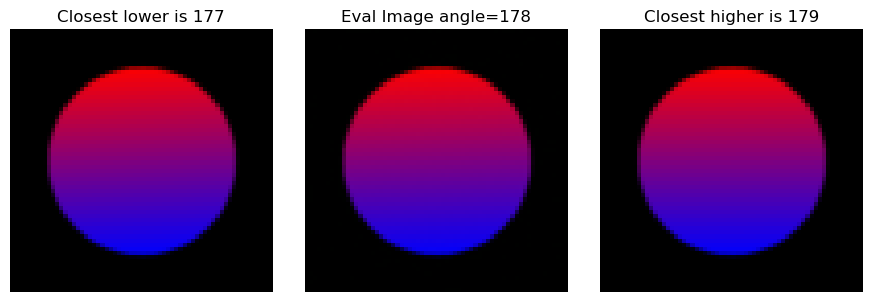

190


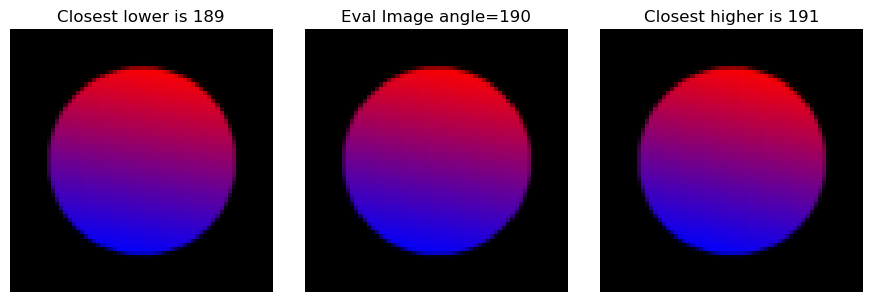

26


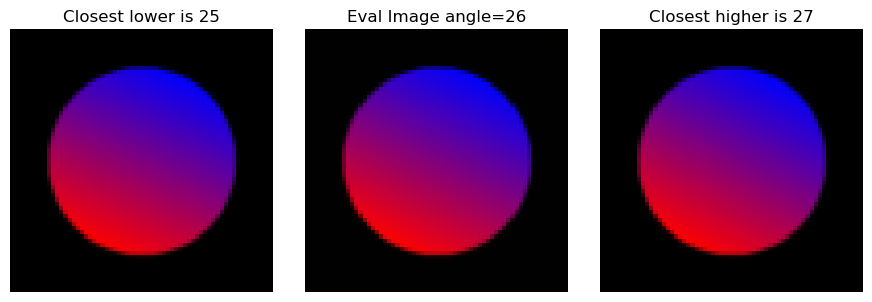

200


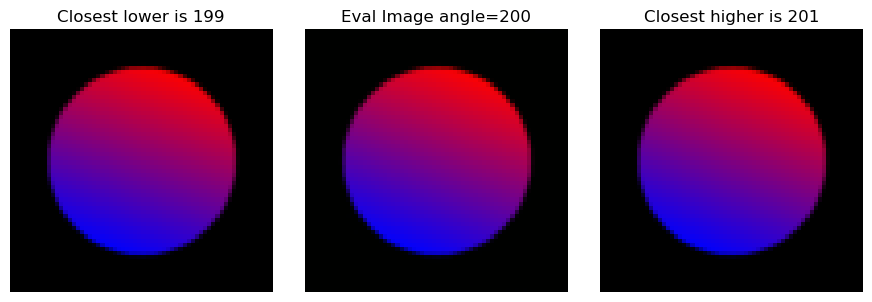

226


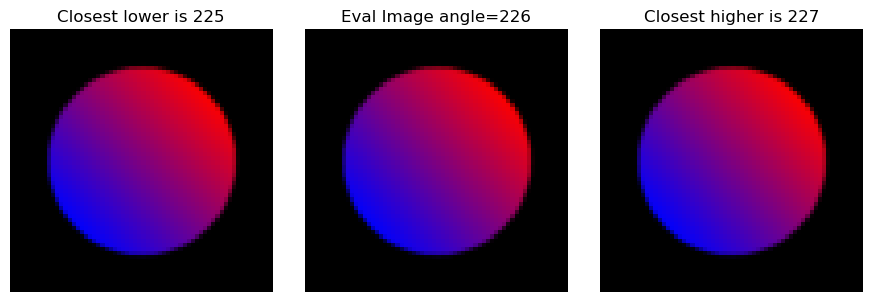

316


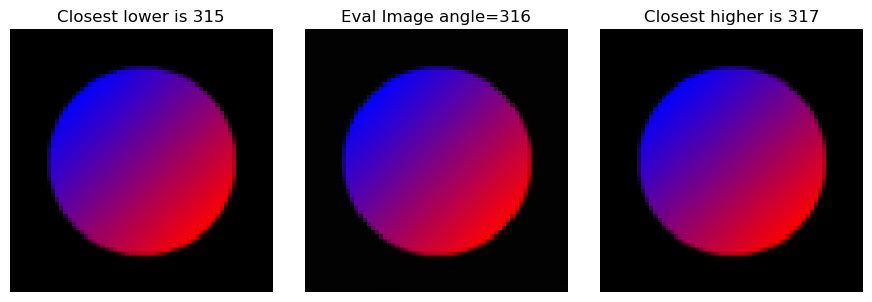

286


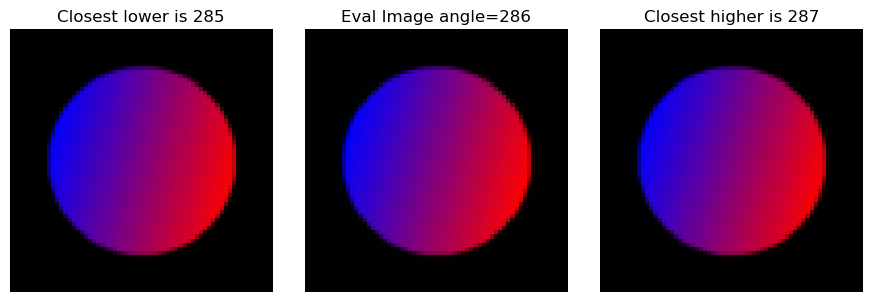

158


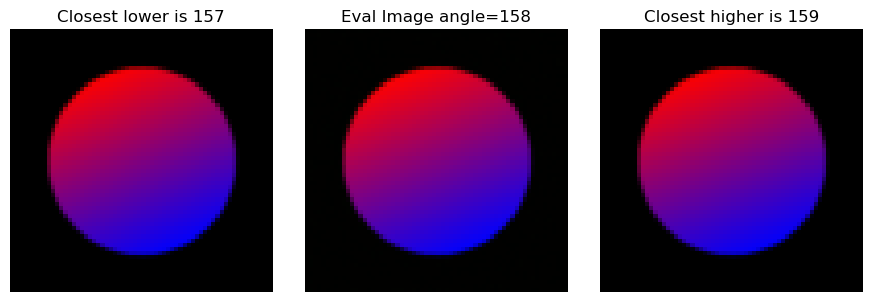

168


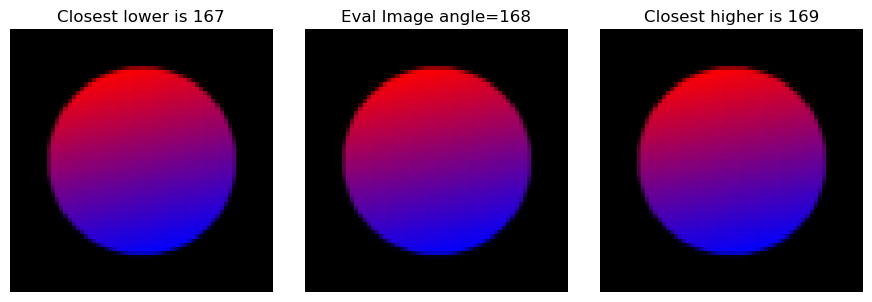

166


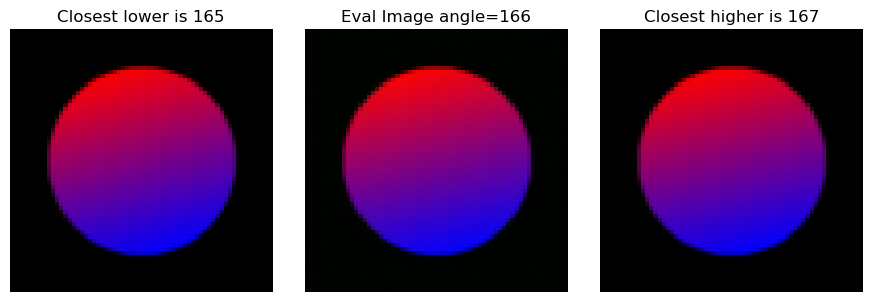

In [8]:

# === Paths ===
csv_path = "data/labels.csv"
eval_images_dir = "show_results4_vec_pipe_step9"
original_images_dir = "data/images"



# === Load CSV ===
df = pd.read_csv(csv_path)

# Ensure x is numeric
df["x"] = pd.to_numeric(df["x"], errors='coerce')
df = df.dropna()

# === Transforms ===
to_tensor = T.ToTensor()
resizer = T.Resize((64, 64))
to_pil = T.ToPILImage()

# === Iterate over small images with even Y ===
for filename in os.listdir(eval_images_dir):
    if not filename.startswith("image_") or not filename.endswith(".png"):
        continue

    try:
        # Extract Y value
        y_value = int(filename.split("_")[2].split(".")[0])
        print(y_value)

        # Only proceed if Y is divisible by 2
        # if y_value % 2 != 0:
        #     continue

        # Find two nearest X values from the original set
        lower_df = df[df["x"] < y_value]
        upper_df = df[df["x"] > y_value]

        if lower_df.empty or upper_df.empty:
            print(f"Skipping Y={y_value}: no lower or upper X in CSV.")
            continue


        x1 = lower_df.iloc[(lower_df["x"] - y_value).abs().argsort().iloc[0]]["x"]
        x2 = upper_df.iloc[(upper_df["x"] - y_value).abs().argsort().iloc[0]]["x"]

        # Load corresponding files
        fname_eval = os.path.join(eval_images_dir, filename)
        fname_x1 = os.path.join(original_images_dir, df[df["x"] == x1]["filename"].values[0])
        fname_x2 = os.path.join(original_images_dir, df[df["x"] == x2]["filename"].values[0])


        # Load and transform
        img_y = resizer(to_tensor(Image.open(fname_eval).convert("RGB")))
        img_x1 = resizer(to_tensor(Image.open(fname_x1).convert("RGB")))
        img_x2 = resizer(to_tensor(Image.open(fname_x2).convert("RGB")))

        # === Plot images ===
        fig, axes = plt.subplots(1, 3, figsize=(9, 3))

        # img__diff1 = torch.abs(img_y - img_x1)
        # img__diff1 = img__diff1 * 10.0  # Amplify difference
        # img__diff1 = torch.clamp(img__diff1, 0, 1)
        # print(torch.min(img__diff1), torch.max(img__diff1), img__diff1.shape)



        images = [img_x1, img_y, img_x2]
        titles = [f"Closest lower is {x1}", f"Eval Image angle={y_value}", f"Closest higher is {x2}"]

        for ax, img, title in zip(axes, images, titles):
            ax.imshow(to_pil(img), cmap = "gray")
            ax.set_title(title)
            ax.axis("off")

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error processing {filename}: {e}")


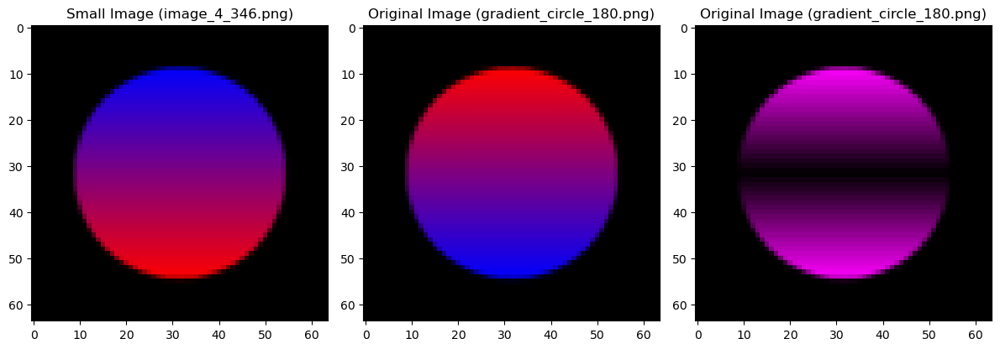

In [30]:
img_x1 = resizer(to_tensor(Image.open(os.path.join(original_images_dir, "gradient_circle_0.png")).convert("RGB")))
img_x2 = resizer(to_tensor(Image.open(os.path.join(original_images_dir, "gradient_circle_180.png")).convert("RGB")))



img__diff1 = torch.abs(img_x1 - img_x2)
img__diff1 = img__diff1 *1.0  # Amplify difference
img__diff1 = torch.clamp(img__diff1, 0, 1)

# plt.imshow(to_pil(img__diff1))


fig, axes = plt.subplots(1, 3, figsize=(12, 6))
axes[0].imshow(to_pil(img_x1))
axes[0].set_title(f"Small Image ({filename})")

axes[1].imshow(to_pil(img_x2))
axes[1].set_title(f"Original Image ({original_filename})")


axes[2].imshow(to_pil(img__diff1))
axes[2].set_title(f"Original Image ({original_filename})")


plt.tight_layout()
plt.show()

original_filename  view_015.png
 view_015.png,  MSE: 0.000113


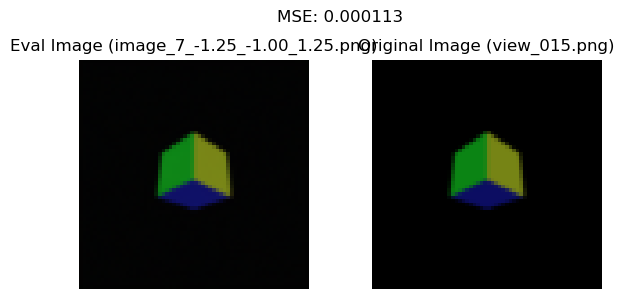

original_filename  view_100.png
 view_100.png,  MSE: 0.000016


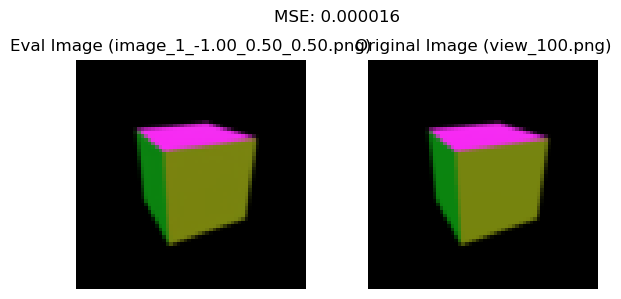

original_filename  view_250.png
 view_250.png,  MSE: 0.000331


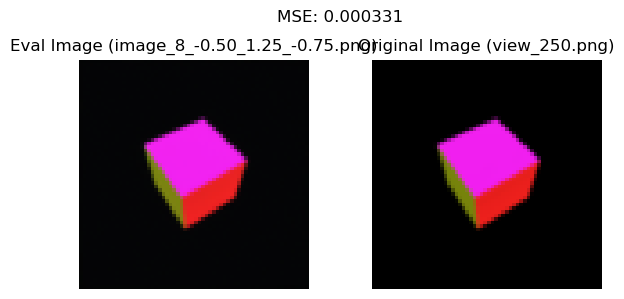

original_filename  view_439.png
 view_439.png,  MSE: 0.000219


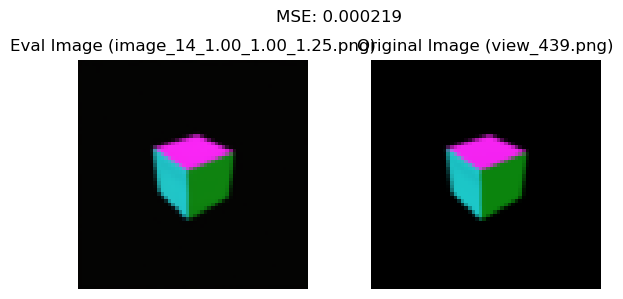

original_filename  view_021.png
 view_021.png,  MSE: 0.000146


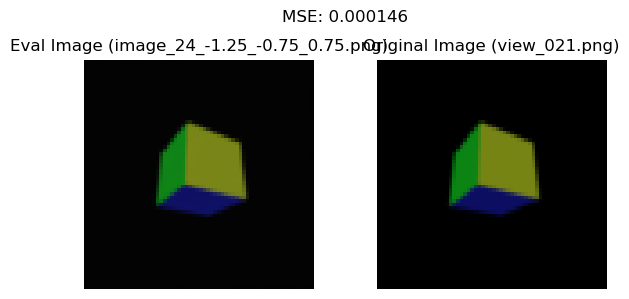

original_filename  view_208.png
 view_208.png,  MSE: 0.000021


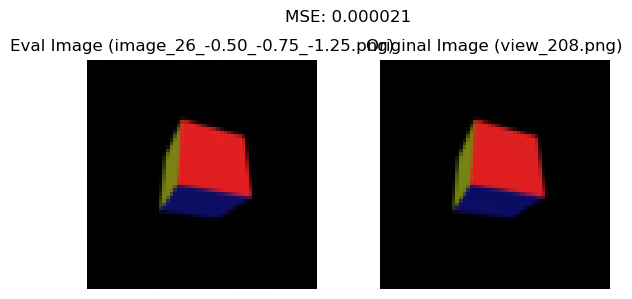

original_filename  view_282.png
 view_282.png,  MSE: 0.000030


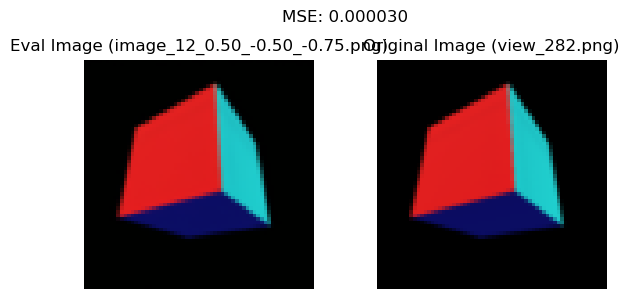

original_filename  view_283.png
 view_283.png,  MSE: 0.000041


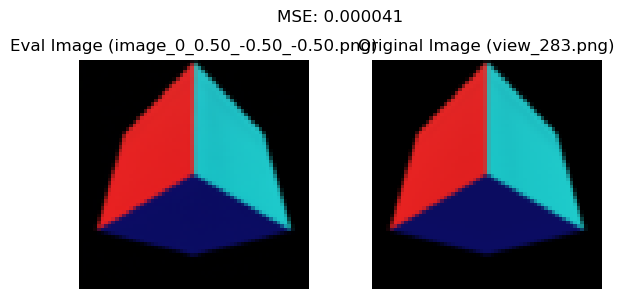

original_filename  view_113.png
 view_113.png,  MSE: 0.000030


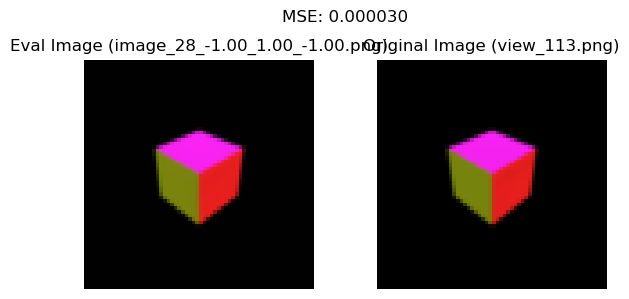

original_filename  view_412.png
 view_412.png,  MSE: 0.000138


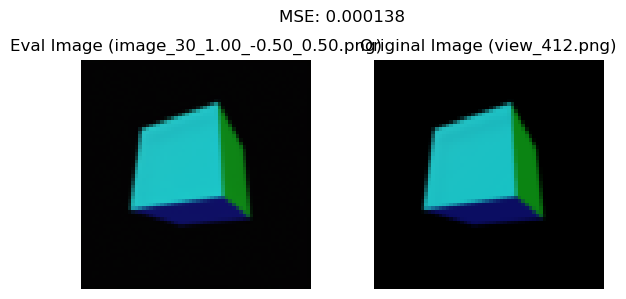

original_filename  view_434.png
 view_434.png,  MSE: 0.000074


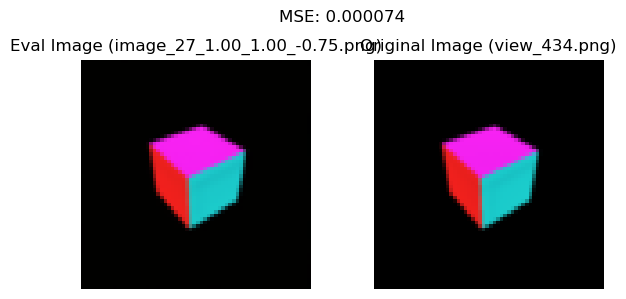

original_filename  view_313.png
 view_313.png,  MSE: 0.000019


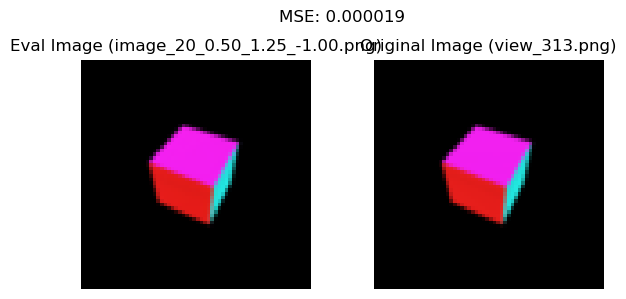

original_filename  view_408.png
 view_408.png,  MSE: 0.000109


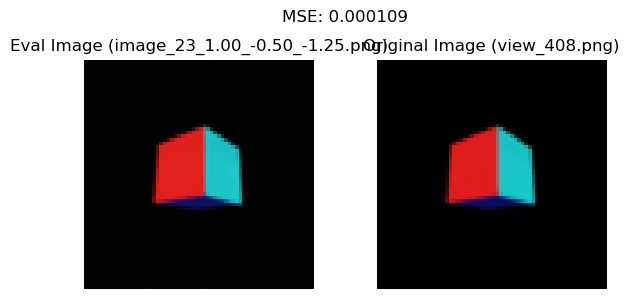

original_filename  view_205.png
 view_205.png,  MSE: 0.000178


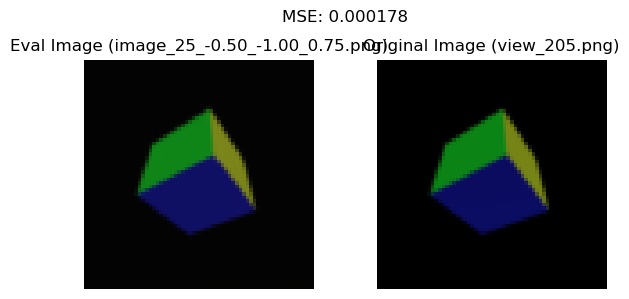

original_filename  view_225.png
 view_225.png,  MSE: 0.000043


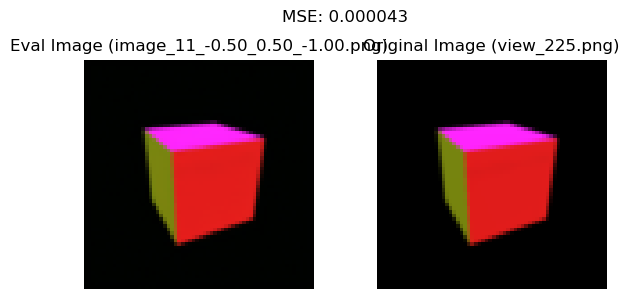

original_filename  view_374.png
 view_374.png,  MSE: 0.000082


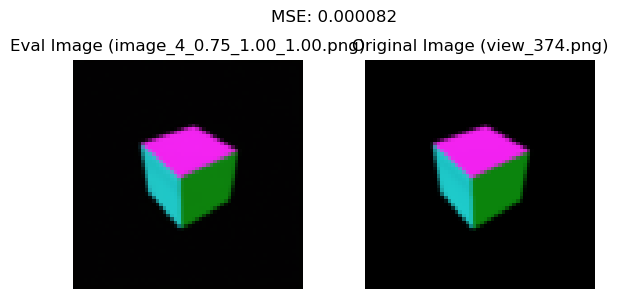

original_filename  view_238.png
 view_238.png,  MSE: 0.000036


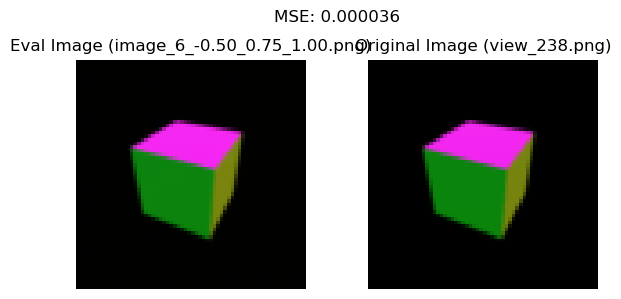

original_filename  view_233.png
 view_233.png,  MSE: 0.000257


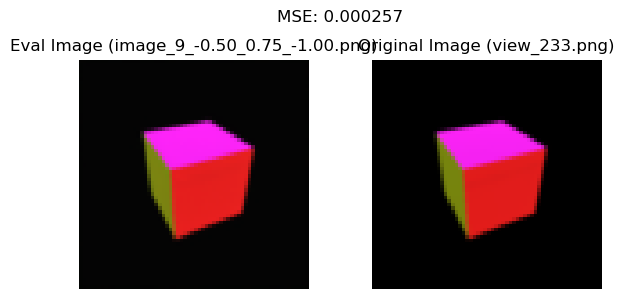

original_filename  view_090.png
 view_090.png,  MSE: 0.000045


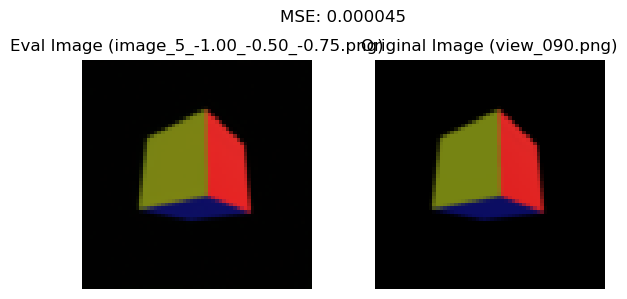

original_filename  view_446.png
 view_446.png,  MSE: 0.000027


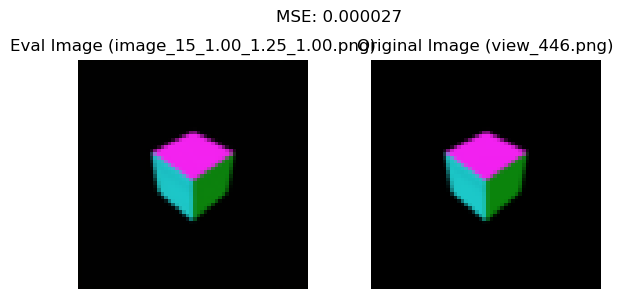

original_filename  view_284.png
 view_284.png,  MSE: 0.000165


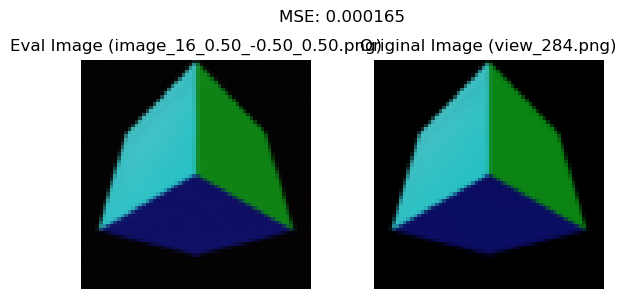

original_filename  view_271.png
 view_271.png,  MSE: 0.000175


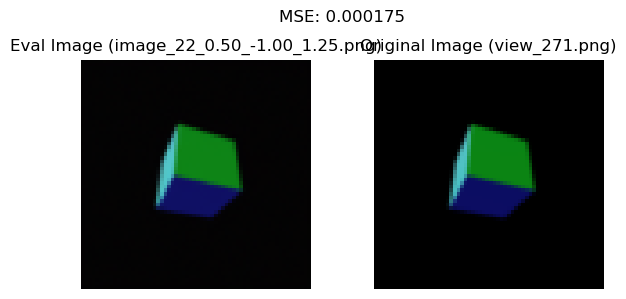

original_filename  view_046.png
 view_046.png,  MSE: 0.000131


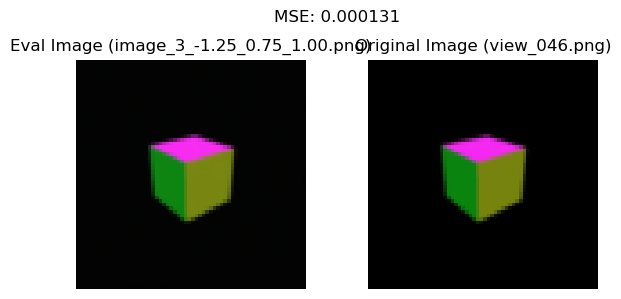

original_filename  view_220.png
 view_220.png,  MSE: 0.000097


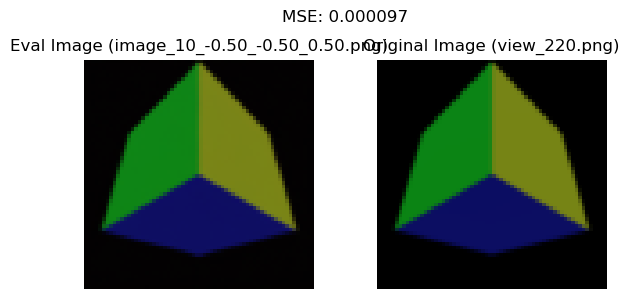

original_filename  view_132.png
 view_132.png,  MSE: 0.000042


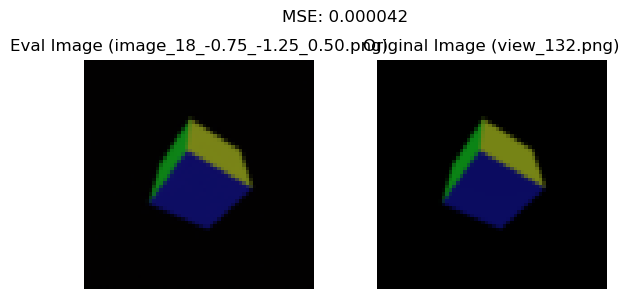

original_filename  view_076.png
 view_076.png,  MSE: 0.000021


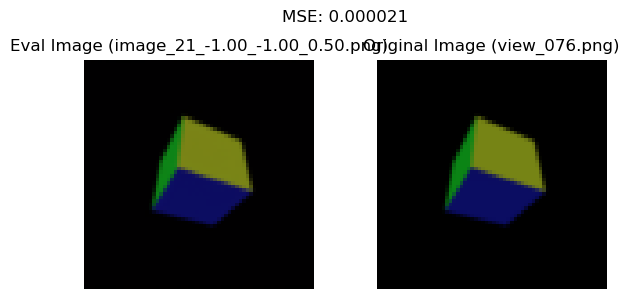

original_filename  view_428.png
 view_428.png,  MSE: 0.000036


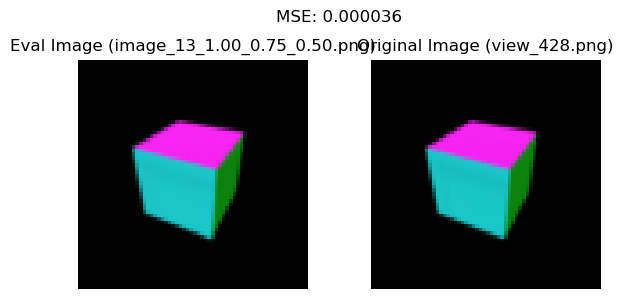

original_filename  view_440.png
 view_440.png,  MSE: 0.000034


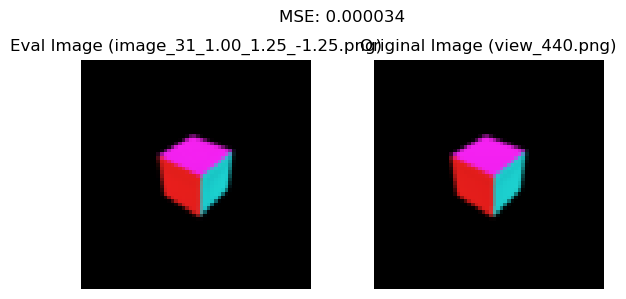

original_filename  view_319.png
 view_319.png,  MSE: 0.000091


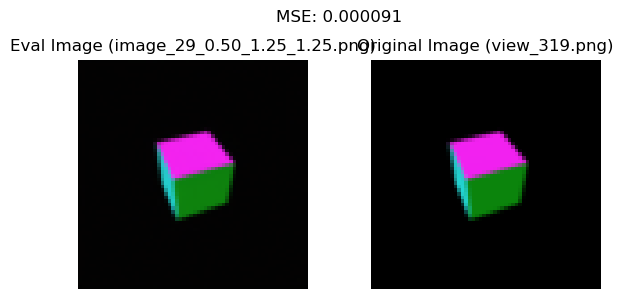

original_filename  view_375.png
 view_375.png,  MSE: 0.000087


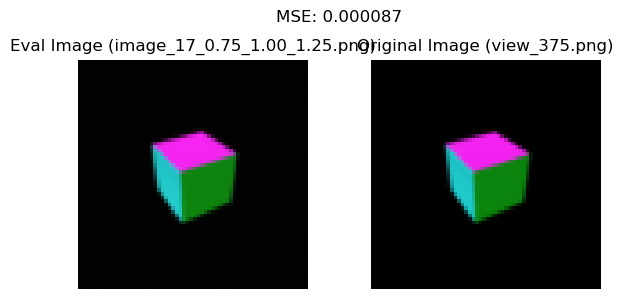

original_filename  view_045.png
 view_045.png,  MSE: 0.000036


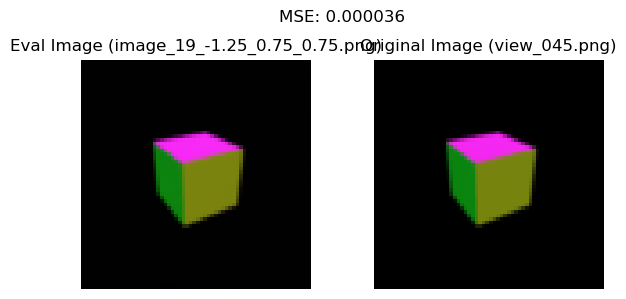

original_filename  view_037.png
 view_037.png,  MSE: 0.000105


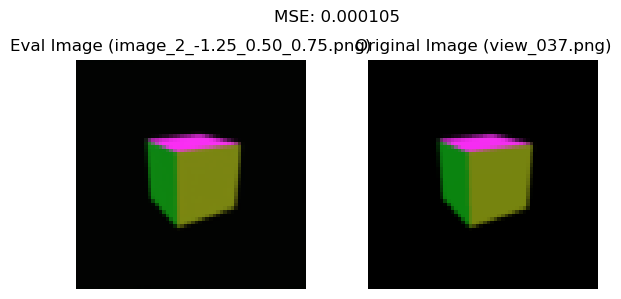

In [2]:

def my_make_grid(images, rows, cols):
    # w, h = images[0,0,:,:].size
    # w=64
    # h=64
    # grid = Image.new("RGB", size=(cols * w, rows * h))
    # for i, image in enumerate(images):
    #     grid.paste(image, box=(i % cols * w, i // cols * h))
    # return grid

    grid = make_grid(images, nrow=3, padding=2, normalize=True)

    # Convert to RGB PIL image
    grid_pil = to_pil_image(grid)
    return grid_pil


# === Paths ===
csv_path = "data_3d/labels.csv"
original_images_dir = "data_3d/images"


eval_images_dir = "show_results_3d_1_again"


# === Load CSV ===
df = pd.read_csv(csv_path, sep=";", decimal=",")

# === Image Transform ===
to_tensor = T.ToTensor()  # Converts PIL image to [0,1] float tensor
to_pil = T.ToPILImage()


# === Comparison Metric: Mean Squared Error ===
def mse(img1, img2):
    return F.mse_loss(img1, img2).item()


eval_images = []
original_images = []



# === Iterate over small images ===
for filename in os.listdir(eval_images_dir):
    if filename.startswith("image_") and filename.endswith(".png"):
        # Extract X from "image_X.png"
        x_value = filename.split("_")[2]
        y_value = filename.split("_")[3]
        z_value = filename.split("_")[4][:-4]
        # print(filename, x_value, y_value, z_value)

        match = df.query(f'x == {x_value} & y == {y_value} & z == {z_value}')

        # print(f" x {float(x_value):.2f}")

        # Find corresponding original filename from CSV
        # match = df.query(f'x == {float(x_value):.2f} & y == {float(y_value):.2f} & z == {float(z_value):.2f}')

        if match.empty:
            print(f"No match found in CSV for x={x_value}")
            continue

        original_filename = match.iloc[0]["filename"]
        print("original_filename ", original_filename)
        small_img_path = os.path.join(eval_images_dir, filename)
        original_img_path = os.path.join(original_images_dir, original_filename)

        # Load images
        try:
            eval_img = to_tensor(Image.open(small_img_path).convert("RGB"))
            original_img = to_tensor(Image.open(original_img_path).convert("RGB"))

            # Resize original to match small image size (if needed)
            if original_img.shape != eval_img.shape:
                original_img = T.Resize(eval_img.shape[1:])(original_img)

            # print(eval_img.shape, original_img.shape)

            # Compute MSE
            error = mse(eval_img, original_img)
            print(f" {original_filename},  MSE: {error:.6f}")


            eval_images.append(eval_img)
            original_images.append(original_img)

            
            # plt.figure(figsize = (12,6))
            # plt.subplot(121)
            # plt.imshow()

            fig, axes = plt.subplots(1, 2, figsize=(6, 3))
            axes[0].imshow(to_pil(eval_img))
            axes[0].set_title(f"Eval Image ({filename})")
            axes[0].axis("off")

            axes[1].imshow(to_pil(original_img))
            axes[1].set_title(f"Original Image ({original_filename})")
            axes[1].axis("off")

            plt.suptitle(f"MSE: {error:.6f}")
            plt.tight_layout()
            plt.show()


        # image_grid = my_make_grid(original_images,rows=4, cols=4)


        except Exception as e:
            print(f"Error processing {filename}: {e}")


if eval_images and original_images:
    grid_eval = make_grid(eval_images, nrow=4, padding=4)
    grid_original = make_grid(original_images, nrow=4, padding=4)

    grid_eval = to_pil_image(grid_eval)
    grid_original = to_pil_image(grid_original)

    # grid_eval.save(f"grid_eval.png")
    # grid_original.save(f"grid_original.png")

In [3]:
df.head()

,filename,x,y,z,rot_x,rot_y,rot_z
0,view_000.png,-1.5,-0.6,-6.000000e-01,339.6255,68.19859,0.000000e+00
1,view_001.png,-1.5,-0.6,-4.000000e-01,338.8688,75.06858,-9.153223e-07
2,view_002.png,-1.5,-0.6,-2.000000e-01,338.3721,82.40536,-1.836868e-06
3,view_003.png,-1.5,-0.6,-2.980232e-08,338.1986,90.00000,0.000000e+00
4,view_004.png,-1.5,-0.6,2.000000e-01,338.3721,97.59467,-1.836868e-06


In [15]:
match = df[(df["x"].astype(str) == -1.25) and (df["y"].astype(str) == -1.25) ]
match

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [20]:
df_filtered = df.query('x == -0.5 & y == -0.5 & z == 0.5')
df_filtered

,filename,x,y,z,rot_x,rot_y,rot_z
220,view_220.png,-0.5,-0.5,0.5,324.7356,135.0,-0.000001


image_10_0.00_0.15_0.00_9.00_6.00_9.00.png 0.00 0.15 0.00 9.00 6.00 9.00
original_filename  plane6223.png
 plane6223.png,  MSE: 0.000085


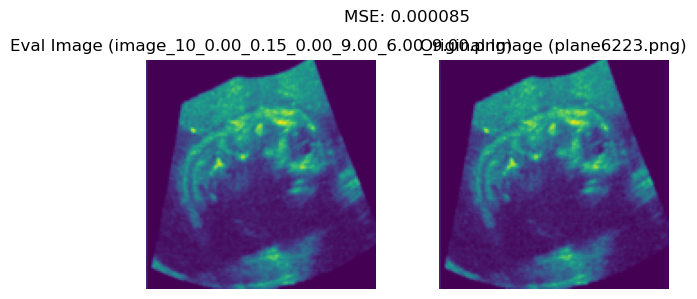

image_29_0.00_-0.10_0.00_9.00_-6.00_9.00.png 0.00 -0.10 0.00 9.00 -6.00 9.00
original_filename  plane2018.png
 plane2018.png,  MSE: 0.000058


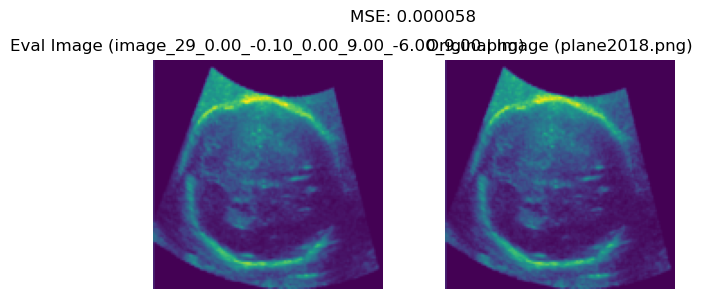

image_24_0.00_0.05_0.00_9.00_2.00_-3.00.png 0.00 0.05 0.00 9.00 2.00 -3.00
No match found in CSV for x=0.00
image_30_0.00_-0.05_0.00_-9.00_6.00_-15.00.png 0.00 -0.05 0.00 -9.00 6.00 -15.00
No match found in CSV for x=0.00
image_0_0.00_-0.10_0.00_9.00_-10.00_-15.00.png 0.00 -0.10 0.00 9.00 -10.00 -15.00
original_filename  plane562.png
 plane562.png,  MSE: 0.000072


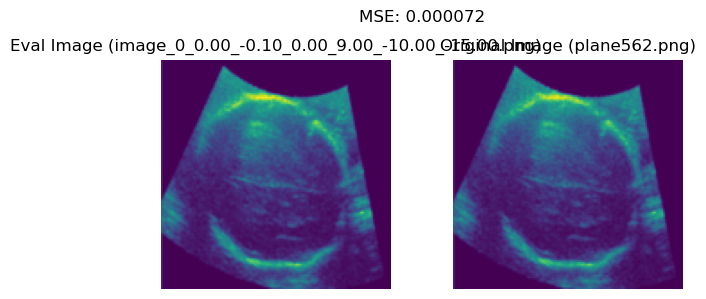

image_22_0.00_-0.00_0.00_9.00_-10.00_-9.00.png 0.00 -0.00 0.00 9.00 -10.00 -9.00
No match found in CSV for x=0.00
image_9_0.00_-0.05_0.00_-3.00_2.00_9.00.png 0.00 -0.05 0.00 -3.00 2.00 9.00
No match found in CSV for x=0.00
image_7_0.00_-0.05_0.00_3.00_6.00_-15.00.png 0.00 -0.05 0.00 3.00 6.00 -15.00
No match found in CSV for x=0.00
image_15_0.00_0.05_0.00_-3.00_-6.00_3.00.png 0.00 0.05 0.00 -3.00 -6.00 3.00
No match found in CSV for x=0.00
image_12_0.00_-0.05_0.00_9.00_2.00_9.00.png 0.00 -0.05 0.00 9.00 2.00 9.00
No match found in CSV for x=0.00
image_19_0.00_0.10_0.00_-3.00_-10.00_9.00.png 0.00 0.10 0.00 -3.00 -10.00 9.00
No match found in CSV for x=0.00
image_27_0.00_0.15_0.00_-9.00_-10.00_-3.00.png 0.00 0.15 0.00 -9.00 -10.00 -3.00
original_filename  plane175.png
 plane175.png,  MSE: 0.000060


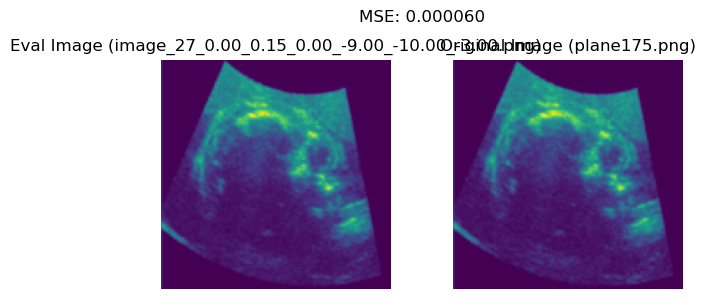

image_16_0.00_-0.00_0.00_-15.00_-10.00_9.00.png 0.00 -0.00 0.00 -15.00 -10.00 9.00
No match found in CSV for x=0.00
image_4_0.00_-0.05_0.00_-3.00_-6.00_-3.00.png 0.00 -0.05 0.00 -3.00 -6.00 -3.00
No match found in CSV for x=0.00
image_3_0.00_-0.15_0.00_3.00_-6.00_-3.00.png 0.00 -0.15 0.00 3.00 -6.00 -3.00
original_filename  plane1849.png
 plane1849.png,  MSE: 0.000057


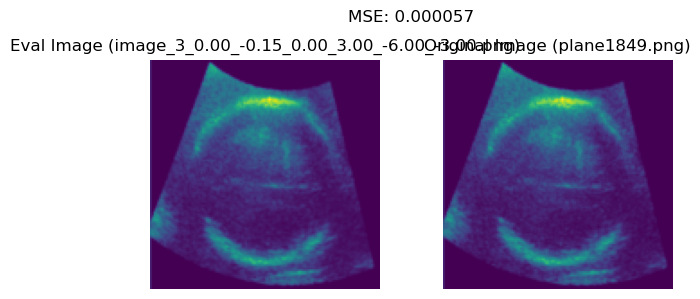

image_18_0.00_-0.15_0.00_-9.00_-6.00_3.00.png 0.00 -0.15 0.00 -9.00 -6.00 3.00
original_filename  plane1583.png
 plane1583.png,  MSE: 0.000061


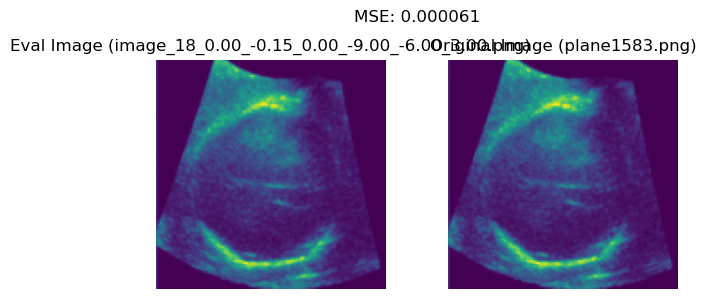

image_25_0.00_-0.00_0.00_-3.00_-2.00_9.00.png 0.00 -0.00 0.00 -3.00 -2.00 9.00
No match found in CSV for x=0.00
image_20_0.00_-0.15_0.00_-15.00_-2.00_-15.00.png 0.00 -0.15 0.00 -15.00 -2.00 -15.00
original_filename  plane2801.png
 plane2801.png,  MSE: 0.000069


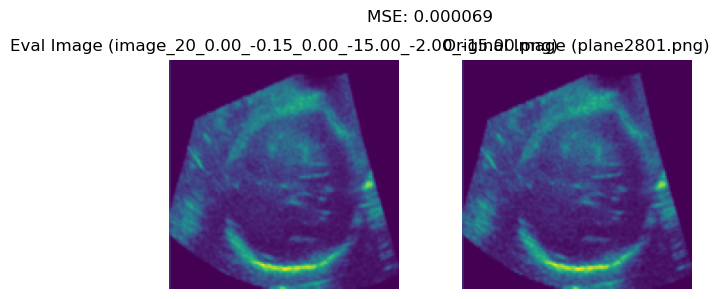

image_2_0.00_-0.10_0.00_-15.00_6.00_9.00.png 0.00 -0.10 0.00 -15.00 6.00 9.00
original_filename  plane5658.png
 plane5658.png,  MSE: 0.000068


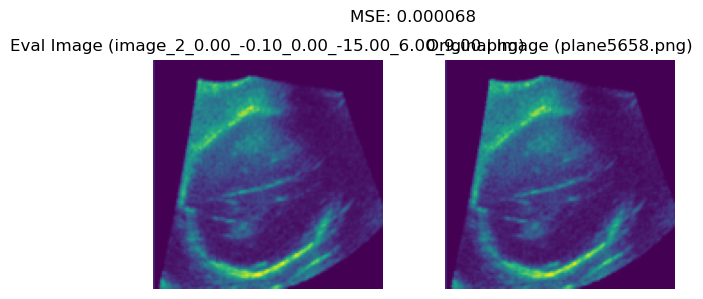

image_26_0.00_-0.10_0.00_-3.00_2.00_9.00.png 0.00 -0.10 0.00 -3.00 2.00 9.00
original_filename  plane4538.png
 plane4538.png,  MSE: 0.000064


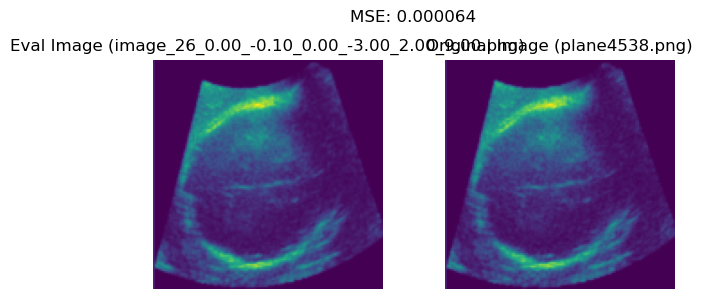

image_8_0.00_-0.05_0.00_9.00_-10.00_-15.00.png 0.00 -0.05 0.00 9.00 -10.00 -15.00
No match found in CSV for x=0.00
image_11_0.00_0.15_0.00_9.00_2.00_-9.00.png 0.00 0.15 0.00 9.00 2.00 -9.00
original_filename  plane4781.png
 plane4781.png,  MSE: 0.000081


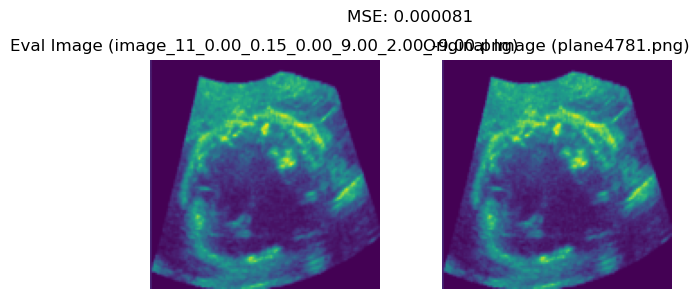

image_17_0.00_-0.10_0.00_9.00_2.00_3.00.png 0.00 -0.10 0.00 9.00 2.00 3.00
original_filename  plane4804.png
 plane4804.png,  MSE: 0.000060


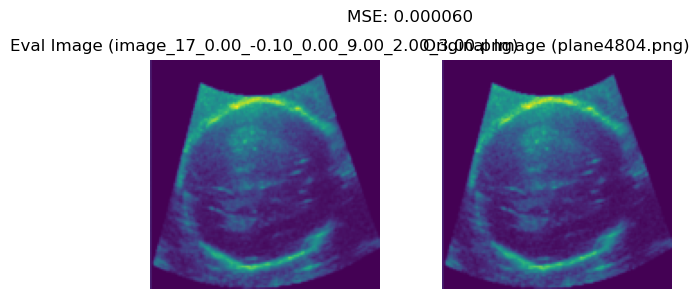

image_1_0.00_-0.10_0.00_3.00_-10.00_-9.00.png 0.00 -0.10 0.00 3.00 -10.00 -9.00
original_filename  plane436.png
 plane436.png,  MSE: 0.000069


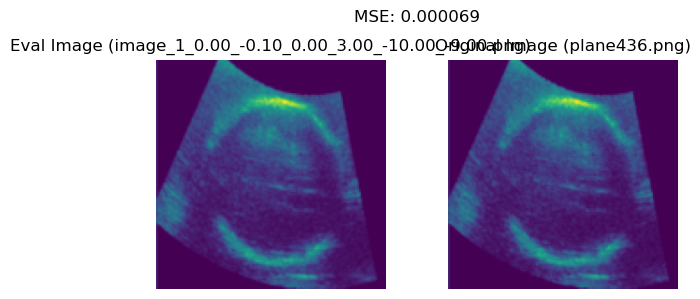

image_5_0.00_-0.10_0.00_-9.00_6.00_-9.00.png 0.00 -0.10 0.00 -9.00 6.00 -9.00
original_filename  plane5756.png
 plane5756.png,  MSE: 0.000071


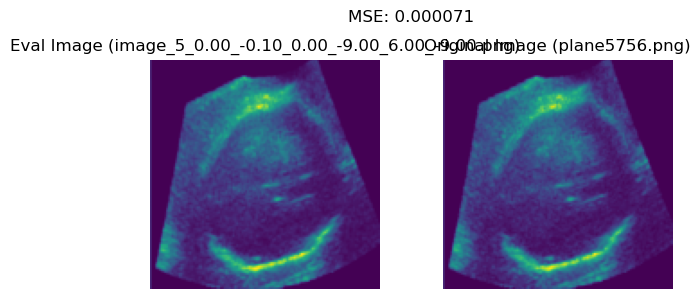

image_6_0.00_-0.10_0.00_9.00_2.00_-3.00.png 0.00 -0.10 0.00 9.00 2.00 -3.00
original_filename  plane4790.png
 plane4790.png,  MSE: 0.010778


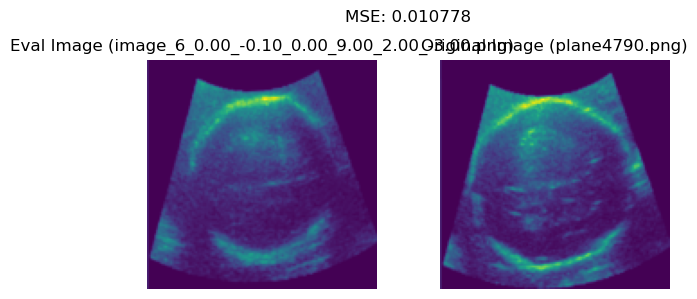

image_21_0.00_-0.05_0.00_-15.00_2.00_3.00.png 0.00 -0.05 0.00 -15.00 2.00 3.00
No match found in CSV for x=0.00
image_31_0.00_0.10_0.00_-9.00_-6.00_-15.00.png 0.00 0.10 0.00 -9.00 -6.00 -15.00
No match found in CSV for x=0.00
image_13_0.00_-0.05_0.00_-3.00_2.00_-9.00.png 0.00 -0.05 0.00 -3.00 2.00 -9.00
No match found in CSV for x=0.00
image_14_0.00_-0.00_0.00_9.00_6.00_9.00.png 0.00 -0.00 0.00 9.00 6.00 9.00
No match found in CSV for x=0.00
image_23_0.00_-0.10_0.00_-15.00_2.00_-9.00.png 0.00 -0.10 0.00 -15.00 2.00 -9.00
original_filename  plane4216.png
 plane4216.png,  MSE: 0.000075


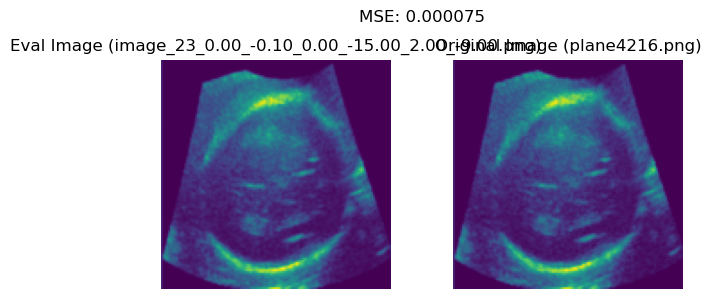

image_28_0.00_-0.15_0.00_3.00_2.00_9.00.png 0.00 -0.15 0.00 3.00 2.00 9.00
original_filename  plane4677.png
 plane4677.png,  MSE: 0.000053


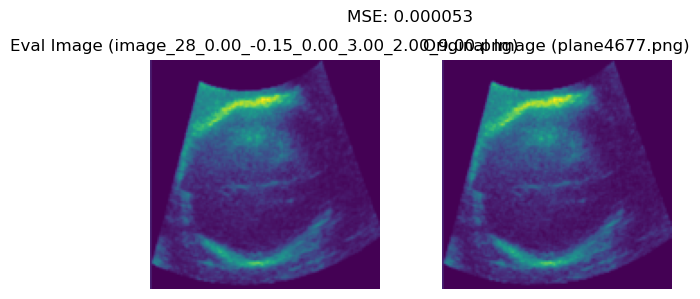

In [2]:

def my_make_grid(images, rows, cols):
    # w, h = images[0,0,:,:].size
    # w=64
    # h=64
    # grid = Image.new("RGB", size=(cols * w, rows * h))
    # for i, image in enumerate(images):
    #     grid.paste(image, box=(i % cols * w, i // cols * h))
    # return grid

    grid = make_grid(images, nrow=3, padding=2, normalize=True)

    # Convert to RGB PIL image
    grid_pil = to_pil_image(grid)
    return grid_pil


# === Paths ===
csv_path = "dataset_Vol3_2/poses_unity.csv"
original_images_dir = "dataset_Vol3_2/images"


eval_images_dir = "show_results_3d_usvol3_2_v3"


# === Load CSV ===
df = pd.read_csv(csv_path)

# === Image Transform ===
to_tensor = T.ToTensor()  # Converts PIL image to [0,1] float tensor
to_pil = T.ToPILImage()


# === Comparison Metric: Mean Squared Error ===
def mse(img1, img2):
    return F.mse_loss(img1, img2).item()


eval_images = []
original_images = []



# === Iterate over small images ===
for filename in os.listdir(eval_images_dir):
    if filename.startswith("image_") and filename.endswith(".png"):
        # Extract X from "image_X.png"
        x_value = filename.split("_")[2]
        y_value = filename.split("_")[3]
        z_value = filename.split("_")[4]

        x_rot_value = filename.split("_")[5]
        y_rot_value = filename.split("_")[6]
        z_rot_value = filename.split("_")[7][:-4]


        print(filename, x_value, y_value, z_value, x_rot_value, y_rot_value, z_rot_value)

        match = df.query(f'pos_x == {x_value} & pos_y  == {y_value} & pos_z  == {z_value} & rot_x == {x_rot_value} & rot_y  == {y_rot_value} & rot_z  == {z_rot_value}')

        # print(f" x {float(x_value):.2f}")

        # Find corresponding original filename from CSV
        # match = df.query(f'x == {float(x_value):.2f} & y == {float(y_value):.2f} & z == {float(z_value):.2f}')

        if match.empty:
            print(f"No match found in CSV for x={x_value}")
            continue

        original_filename = match.iloc[0]["filename"]
        print("original_filename ", original_filename)
        small_img_path = os.path.join(eval_images_dir, filename)
        original_img_path = os.path.join(original_images_dir, original_filename)

        # Load images
        try:
            eval_img = to_tensor(Image.open(small_img_path).convert("L"))
            original_img = to_tensor(Image.open(original_img_path).convert("L"))

            # Resize original to match small image size (if needed)
            if original_img.shape != eval_img.shape:
                original_img = T.Resize(eval_img.shape[1:])(original_img)

            # print(eval_img.shape, original_img.shape)

            # Compute MSE
            error = mse(eval_img, original_img)
            print(f" {original_filename},  MSE: {error:.6f}")


            eval_images.append(eval_img)
            original_images.append(original_img)

            
            # plt.figure(figsize = (12,6))
            # plt.subplot(121)
            # plt.imshow()

            fig, axes = plt.subplots(1, 2, figsize=(6, 3))
            axes[0].imshow(to_pil(eval_img))
            axes[0].set_title(f"Eval Image ({filename})")
            axes[0].axis("off")

            axes[1].imshow(to_pil(original_img))
            axes[1].set_title(f"Original Image ({original_filename})")
            axes[1].axis("off")

            plt.suptitle(f"MSE: {error:.6f}")
            plt.tight_layout()
            plt.show()


        # image_grid = my_make_grid(original_images,rows=4, cols=4)


        except Exception as e:
            print(f"Error processing {filename}: {e}")


if eval_images and original_images:
    grid_eval = make_grid(eval_images, nrow=4, padding=4)
    grid_original = make_grid(original_images, nrow=4, padding=4)

    grid_eval = to_pil_image(grid_eval)
    grid_original = to_pil_image(grid_original)

    # grid_eval.save(f"grid_eval.png")
    # grid_original.save(f"grid_original.png")

In [5]:
def my_make_grid(images, rows, cols):
    # w, h = images[0,0,:,:].size
    # w=64
    # h=64
    # grid = Image.new("RGB", size=(cols * w, rows * h))
    # for i, image in enumerate(images):
    #     grid.paste(image, box=(i % cols * w, i // cols * h))
    # return grid

    grid = make_grid(images, nrow=3, padding=2, normalize=True)

    # Convert to RGB PIL image
    grid_pil = to_pil_image(grid)
    return grid_pil




# === Load CSV ===

# === Image Transform ===
to_tensor = T.ToTensor()  # Converts PIL image to [0,1] float tensor
to_pil = T.ToPILImage()


# === Comparison Metric: Mean Squared Error ===
def mse(img1, img2):
    return F.mse_loss(img1, img2).item()





def show_and_calculate_results(csv_path, original_images_dir, eval_images_dir, plot_images):

    df = pd.read_csv(csv_path)

    eval_images = []
    original_images = []

    results_list = []

# === Iterate over small images ===
    for filename in os.listdir(eval_images_dir):
        if filename.startswith("image_") and filename.endswith(".png"):
            # Extract X from "image_X.png"
            x_value = filename.split("_")[2]
            y_value = filename.split("_")[3]
            z_value = filename.split("_")[4]

            x_rot_value = filename.split("_")[5]
            y_rot_value = filename.split("_")[6]
            z_rot_value = filename.split("_")[7][:-4]


            print(filename, x_value, y_value, z_value, x_rot_value, y_rot_value, z_rot_value)

            match = df.query(f'pos_x == {x_value} & pos_y  == {y_value} & pos_z  == {z_value} & rot_x == {x_rot_value} & rot_y  == {y_rot_value} & rot_z  == {z_rot_value}')

            # print(f" x {float(x_value):.2f}")

            # Find corresponding original filename from CSV
            # match = df.query(f'x == {float(x_value):.2f} & y == {float(y_value):.2f} & z == {float(z_value):.2f}')

            if match.empty:
                print(f"No match found in CSV for x={x_value}")
                continue

            original_filename = match.iloc[0]["filename"]
            # print("original_filename ", original_filename)

            small_img_path = os.path.join(eval_images_dir, filename)
            original_img_path = os.path.join(original_images_dir, original_filename)

            # Load images
            try:
                eval_img = to_tensor(Image.open(small_img_path).convert("L"))
                original_img = to_tensor(Image.open(original_img_path).convert("L"))

                # Resize original to match small image size (if needed)
                if original_img.shape != eval_img.shape:
                    original_img = T.Resize(eval_img.shape[1:])(original_img)

                # print(eval_img.shape, original_img.shape)

                # Compute MSE
                error = mse(eval_img, original_img)
                print(f" {filename},  MSE: {error:.6f}")

                results_list.append([original_filename,error])


                eval_images.append(eval_img)
                original_images.append(original_img)

                
                # plt.figure(figsize = (12,6))
                # plt.subplot(121)
                # plt.imshow()

                if plot_images:
                    fig, axes = plt.subplots(1, 2, figsize=(6, 3))
                    axes[0].imshow(to_pil(eval_img))
                    axes[0].set_title(f"Eval Image ({filename})")
                    axes[0].axis("off")

                    axes[1].imshow(to_pil(original_img))
                    axes[1].set_title(f"Original Image ({original_filename})")
                    axes[1].axis("off")

                    plt.suptitle(f"MSE: {error:.6f}")
                    plt.tight_layout()
                    plt.show()


            # image_grid = my_make_grid(original_images,rows=4, cols=4)


            except Exception as e:
                print(f"Error processing {filename}: {e}")

    # print(results_list[0])
    # print(results_list[1])

    results_df = pd.DataFrame(results_list, columns=["filename", "MSE"])

    return results_df
# if eval_images and original_images:
#     grid_eval = make_grid(eval_images, nrow=4, padding=4)
#     grid_original = make_grid(original_images, nrow=4, padding=4)

#     grid_eval = to_pil_image(grid_eval)
#     grid_original = to_pil_image(grid_original)

    # grid_eval.save(f"grid_eval.png")
    # grid_original.save(f"grid_original.png")


    

image_10_0.00_0.15_0.00_9.00_6.00_9.00.png 0.00 0.15 0.00 9.00 6.00 9.00
 image_10_0.00_0.15_0.00_9.00_6.00_9.00.png,  MSE: 0.000083


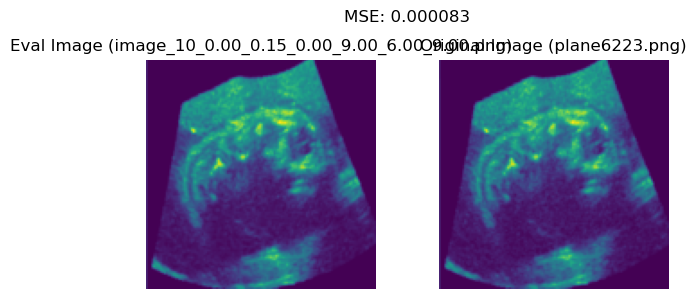

image_63_0.00_-0.00_0.00_3.00_6.00_9.00.png 0.00 -0.00 0.00 3.00 6.00 9.00
No match found in CSV for x=0.00
image_38_0.00_0.05_0.00_9.00_-10.00_-15.00.png 0.00 0.05 0.00 9.00 -10.00 -15.00
No match found in CSV for x=0.00
image_29_0.00_-0.10_0.00_9.00_-6.00_9.00.png 0.00 -0.10 0.00 9.00 -6.00 9.00
 image_29_0.00_-0.10_0.00_9.00_-6.00_9.00.png,  MSE: 0.000058


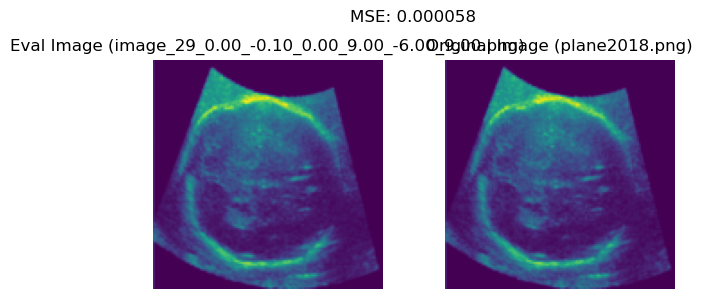

image_24_0.00_0.05_0.00_9.00_2.00_-3.00.png 0.00 0.05 0.00 9.00 2.00 -3.00
No match found in CSV for x=0.00
image_30_0.00_-0.05_0.00_-9.00_6.00_-15.00.png 0.00 -0.05 0.00 -9.00 6.00 -15.00
No match found in CSV for x=0.00
image_37_0.00_-0.05_0.00_-15.00_-2.00_9.00.png 0.00 -0.05 0.00 -15.00 -2.00 9.00
No match found in CSV for x=0.00
image_0_0.00_-0.10_0.00_9.00_-10.00_-15.00.png 0.00 -0.10 0.00 9.00 -10.00 -15.00
 image_0_0.00_-0.10_0.00_9.00_-10.00_-15.00.png,  MSE: 0.000072


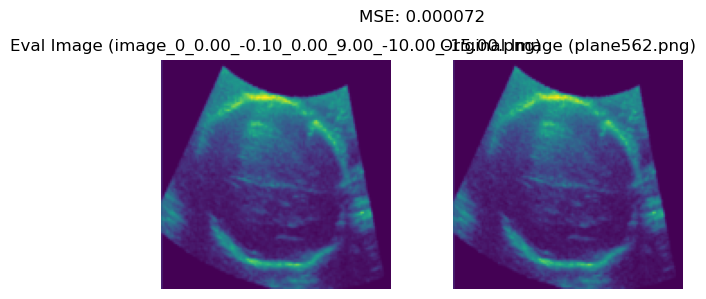

image_59_0.00_0.15_0.00_-3.00_-10.00_3.00.png 0.00 0.15 0.00 -3.00 -10.00 3.00
 image_59_0.00_0.15_0.00_-3.00_-10.00_3.00.png,  MSE: 0.000069


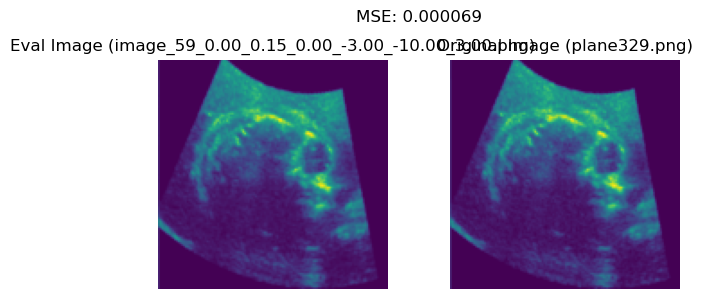

image_22_0.00_-0.00_0.00_9.00_-10.00_-9.00.png 0.00 -0.00 0.00 9.00 -10.00 -9.00
No match found in CSV for x=0.00
image_9_0.00_-0.05_0.00_-3.00_2.00_9.00.png 0.00 -0.05 0.00 -3.00 2.00 9.00
No match found in CSV for x=0.00
image_7_0.00_-0.05_0.00_3.00_6.00_-15.00.png 0.00 -0.05 0.00 3.00 6.00 -15.00
No match found in CSV for x=0.00
image_15_0.00_0.05_0.00_-3.00_-6.00_3.00.png 0.00 0.05 0.00 -3.00 -6.00 3.00
No match found in CSV for x=0.00
image_12_0.00_-0.05_0.00_9.00_2.00_9.00.png 0.00 -0.05 0.00 9.00 2.00 9.00
No match found in CSV for x=0.00
image_52_0.00_0.05_0.00_3.00_2.00_9.00.png 0.00 0.05 0.00 3.00 2.00 9.00
No match found in CSV for x=0.00
image_19_0.00_0.10_0.00_-3.00_-10.00_9.00.png 0.00 0.10 0.00 -3.00 -10.00 9.00
No match found in CSV for x=0.00
image_55_0.00_-0.00_0.00_-9.00_-2.00_9.00.png 0.00 -0.00 0.00 -9.00 -2.00 9.00
No match found in CSV for x=0.00
image_27_0.00_0.15_0.00_-9.00_-10.00_-3.00.png 0.00 0.15 0.00 -9.00 -10.00 -3.00
 image_27_0.00_0.15_0.00_-9.00_-10.00

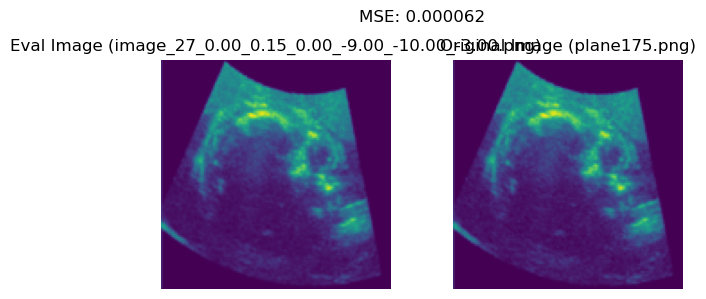

image_16_0.00_-0.00_0.00_-15.00_-10.00_9.00.png 0.00 -0.00 0.00 -15.00 -10.00 9.00
No match found in CSV for x=0.00
image_4_0.00_-0.05_0.00_-3.00_-6.00_-3.00.png 0.00 -0.05 0.00 -3.00 -6.00 -3.00
No match found in CSV for x=0.00
image_35_0.00_-0.10_0.00_-15.00_-10.00_-9.00.png 0.00 -0.10 0.00 -15.00 -10.00 -9.00
 image_35_0.00_-0.10_0.00_-15.00_-10.00_-9.00.png,  MSE: 0.000070


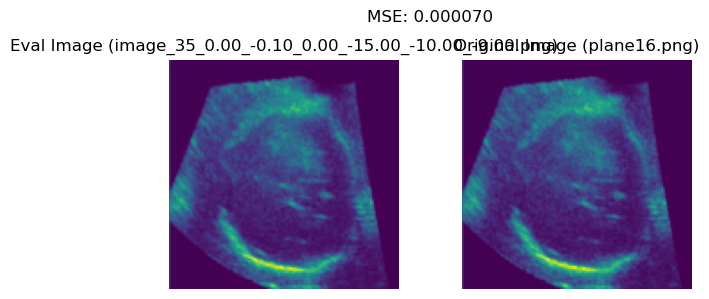

image_53_0.00_-0.05_0.00_-9.00_-6.00_9.00.png 0.00 -0.05 0.00 -9.00 -6.00 9.00
No match found in CSV for x=0.00
image_3_0.00_-0.15_0.00_3.00_-6.00_-3.00.png 0.00 -0.15 0.00 3.00 -6.00 -3.00
 image_3_0.00_-0.15_0.00_3.00_-6.00_-3.00.png,  MSE: 0.000054


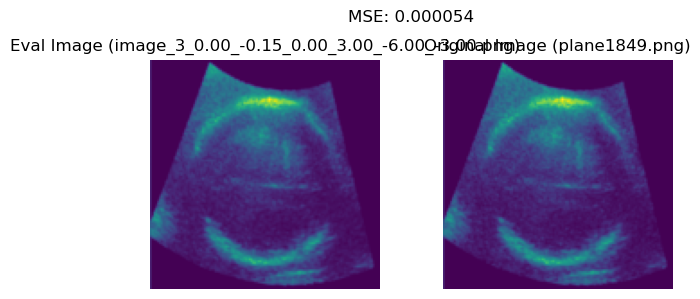

image_18_0.00_-0.15_0.00_-9.00_-6.00_3.00.png 0.00 -0.15 0.00 -9.00 -6.00 3.00
 image_18_0.00_-0.15_0.00_-9.00_-6.00_3.00.png,  MSE: 0.000061


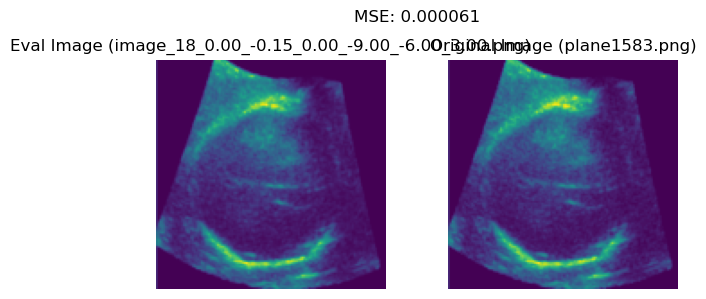

image_49_0.00_0.15_0.00_-3.00_-2.00_3.00.png 0.00 0.15 0.00 -3.00 -2.00 3.00
 image_49_0.00_0.15_0.00_-3.00_-2.00_3.00.png,  MSE: 0.000055


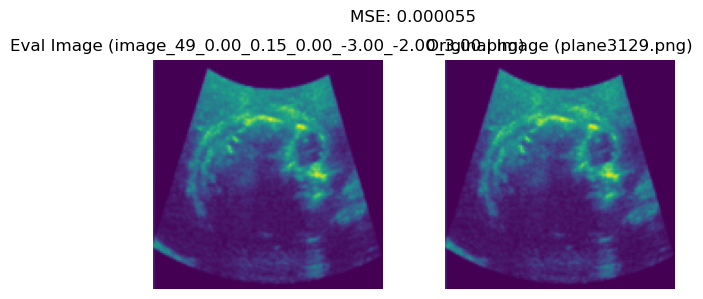

image_25_0.00_-0.00_0.00_-3.00_-2.00_9.00.png 0.00 -0.00 0.00 -3.00 -2.00 9.00
No match found in CSV for x=0.00
image_20_0.00_-0.15_0.00_-15.00_-2.00_-15.00.png 0.00 -0.15 0.00 -15.00 -2.00 -15.00
 image_20_0.00_-0.15_0.00_-15.00_-2.00_-15.00.png,  MSE: 0.000071


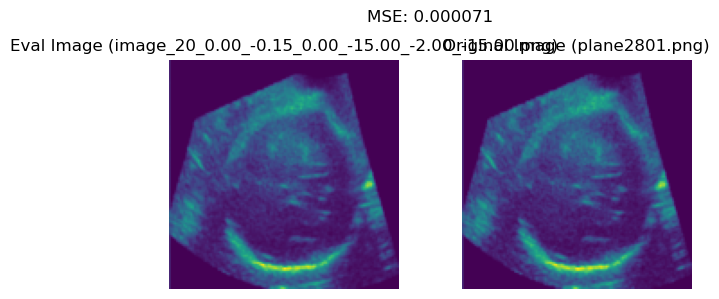

image_58_0.00_0.15_0.00_-15.00_-10.00_9.00.png 0.00 0.15 0.00 -15.00 -10.00 9.00
 image_58_0.00_0.15_0.00_-15.00_-10.00_9.00.png,  MSE: 0.000083


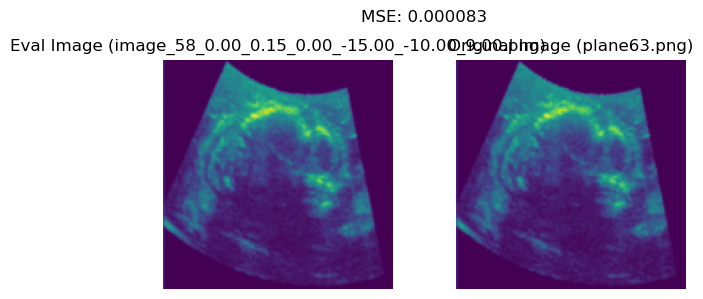

image_2_0.00_-0.10_0.00_-15.00_6.00_9.00.png 0.00 -0.10 0.00 -15.00 6.00 9.00
 image_2_0.00_-0.10_0.00_-15.00_6.00_9.00.png,  MSE: 0.000070


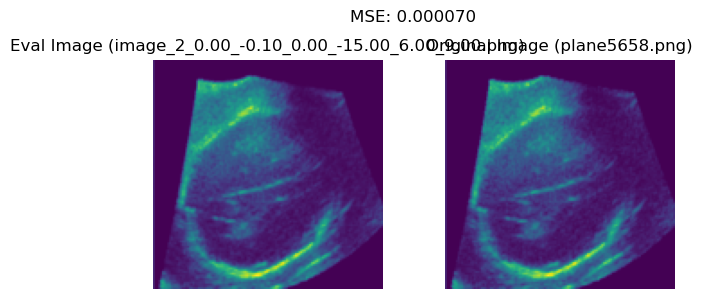

image_62_0.00_0.15_0.00_-15.00_-10.00_3.00.png 0.00 0.15 0.00 -15.00 -10.00 3.00
 image_62_0.00_0.15_0.00_-15.00_-10.00_3.00.png,  MSE: 0.000077


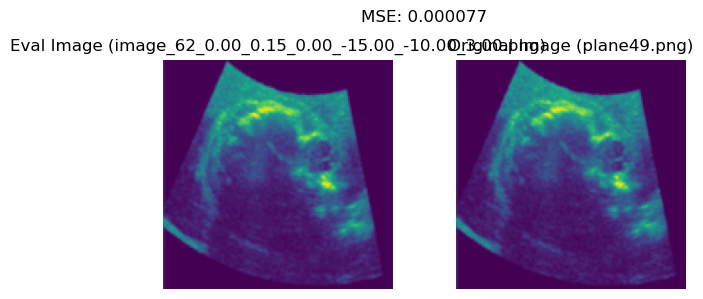

image_61_0.00_-0.00_0.00_-3.00_-6.00_-3.00.png 0.00 -0.00 0.00 -3.00 -6.00 -3.00
No match found in CSV for x=0.00
image_40_0.00_-0.05_0.00_-3.00_-2.00_-3.00.png 0.00 -0.05 0.00 -3.00 -2.00 -3.00
No match found in CSV for x=0.00
image_48_0.00_-0.15_0.00_-15.00_-10.00_-3.00.png 0.00 -0.15 0.00 -15.00 -10.00 -3.00
 image_48_0.00_-0.15_0.00_-15.00_-10.00_-3.00.png,  MSE: 0.000066


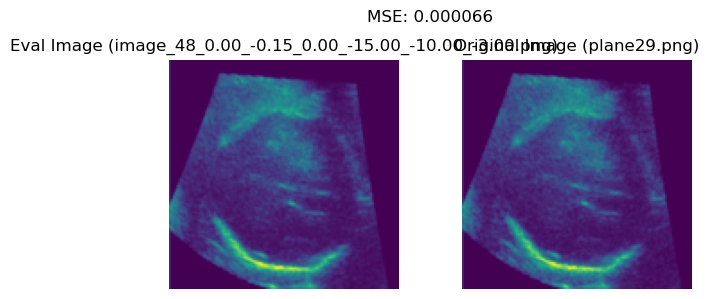

image_44_0.00_-0.10_0.00_-15.00_6.00_-3.00.png 0.00 -0.10 0.00 -15.00 6.00 -3.00
 image_44_0.00_-0.10_0.00_-15.00_6.00_-3.00.png,  MSE: 0.000070


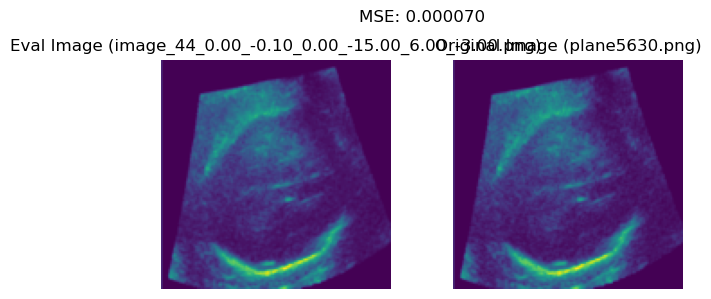

image_56_0.00_-0.15_0.00_-15.00_-6.00_-15.00.png 0.00 -0.15 0.00 -15.00 -6.00 -15.00
 image_56_0.00_-0.15_0.00_-15.00_-6.00_-15.00.png,  MSE: 0.000076


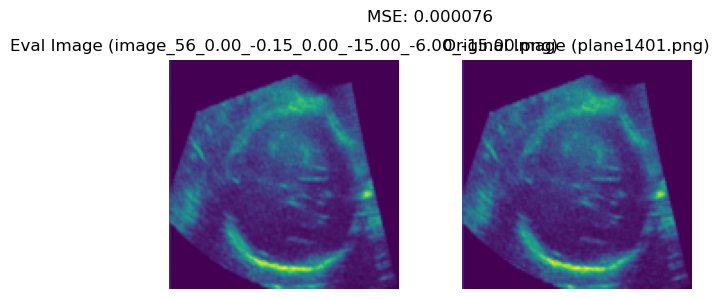

image_26_0.00_-0.10_0.00_-3.00_2.00_9.00.png 0.00 -0.10 0.00 -3.00 2.00 9.00
 image_26_0.00_-0.10_0.00_-3.00_2.00_9.00.png,  MSE: 0.000064


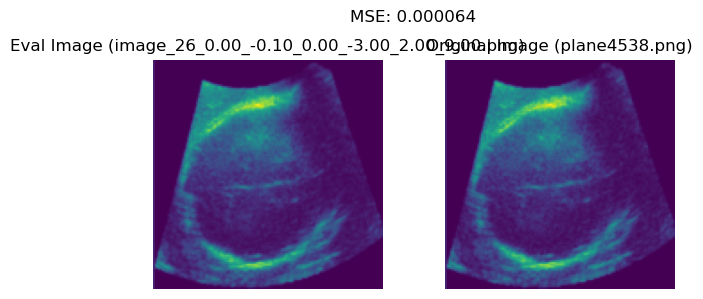

image_36_0.00_0.15_0.00_-3.00_-6.00_-15.00.png 0.00 0.15 0.00 -3.00 -6.00 -15.00
 image_36_0.00_0.15_0.00_-3.00_-6.00_-15.00.png,  MSE: 0.000068


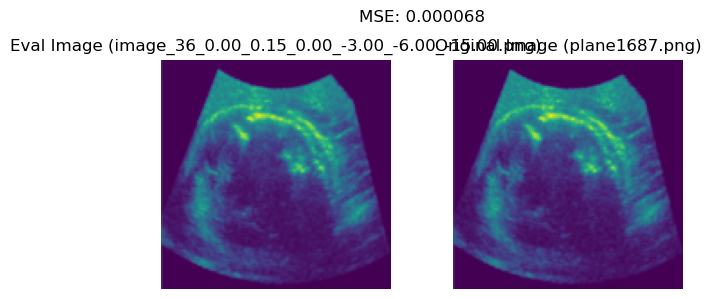

image_60_0.00_0.15_0.00_9.00_2.00_-15.00.png 0.00 0.15 0.00 9.00 2.00 -15.00
 image_60_0.00_0.15_0.00_9.00_2.00_-15.00.png,  MSE: 0.000075


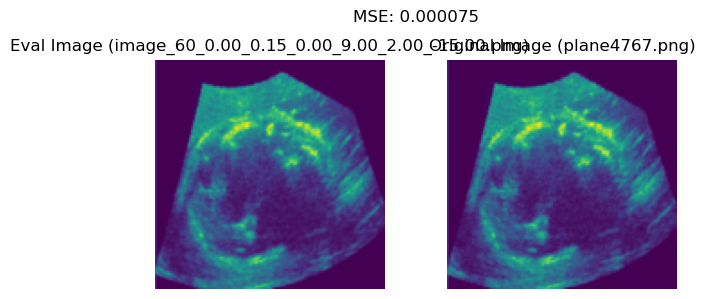

image_8_0.00_-0.05_0.00_9.00_-10.00_-15.00.png 0.00 -0.05 0.00 9.00 -10.00 -15.00
No match found in CSV for x=0.00
image_11_0.00_0.15_0.00_9.00_2.00_-9.00.png 0.00 0.15 0.00 9.00 2.00 -9.00
 image_11_0.00_0.15_0.00_9.00_2.00_-9.00.png,  MSE: 0.000079


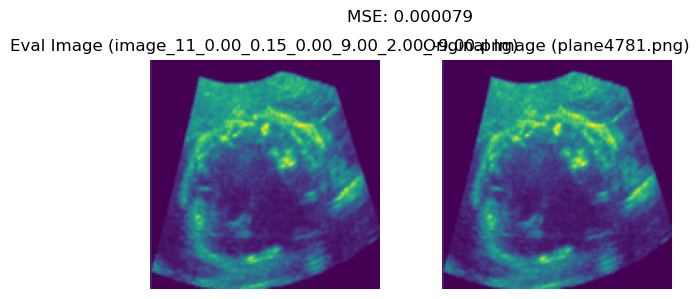

image_46_0.00_0.05_0.00_3.00_-6.00_9.00.png 0.00 0.05 0.00 3.00 -6.00 9.00
No match found in CSV for x=0.00
image_34_0.00_-0.00_0.00_-15.00_2.00_3.00.png 0.00 -0.00 0.00 -15.00 2.00 3.00
No match found in CSV for x=0.00
image_17_0.00_-0.10_0.00_9.00_2.00_3.00.png 0.00 -0.10 0.00 9.00 2.00 3.00
 image_17_0.00_-0.10_0.00_9.00_2.00_3.00.png,  MSE: 0.004530


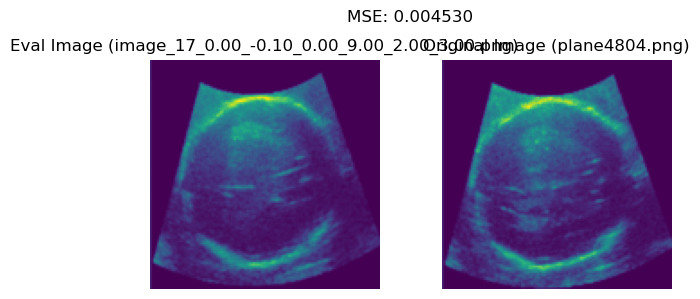

image_57_0.00_-0.05_0.00_-15.00_-2.00_-3.00.png 0.00 -0.05 0.00 -15.00 -2.00 -3.00
No match found in CSV for x=0.00
image_1_0.00_-0.10_0.00_3.00_-10.00_-9.00.png 0.00 -0.10 0.00 3.00 -10.00 -9.00
 image_1_0.00_-0.10_0.00_3.00_-10.00_-9.00.png,  MSE: 0.000065


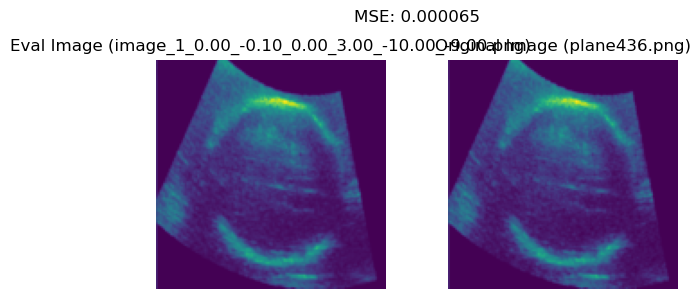

image_5_0.00_-0.10_0.00_-9.00_6.00_-9.00.png 0.00 -0.10 0.00 -9.00 6.00 -9.00
 image_5_0.00_-0.10_0.00_-9.00_6.00_-9.00.png,  MSE: 0.000073


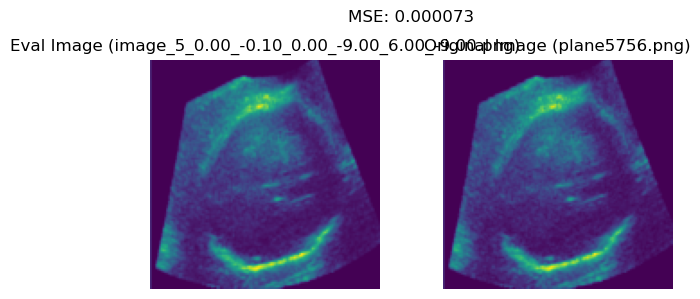

image_43_0.00_0.15_0.00_-9.00_-6.00_-3.00.png 0.00 0.15 0.00 -9.00 -6.00 -3.00
 image_43_0.00_0.15_0.00_-9.00_-6.00_-3.00.png,  MSE: 0.000054


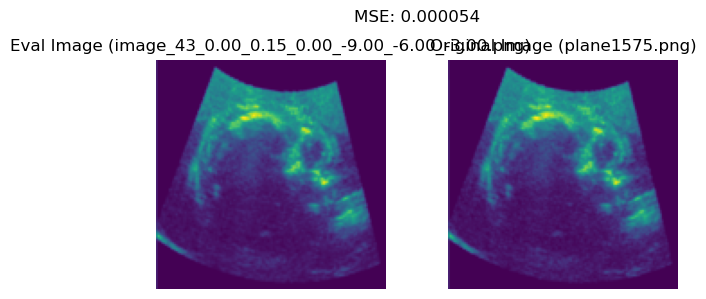

image_50_0.00_0.10_0.00_3.00_2.00_9.00.png 0.00 0.10 0.00 3.00 2.00 9.00
No match found in CSV for x=0.00
image_6_0.00_-0.10_0.00_9.00_2.00_-3.00.png 0.00 -0.10 0.00 9.00 2.00 -3.00
 image_6_0.00_-0.10_0.00_9.00_2.00_-3.00.png,  MSE: 0.010855


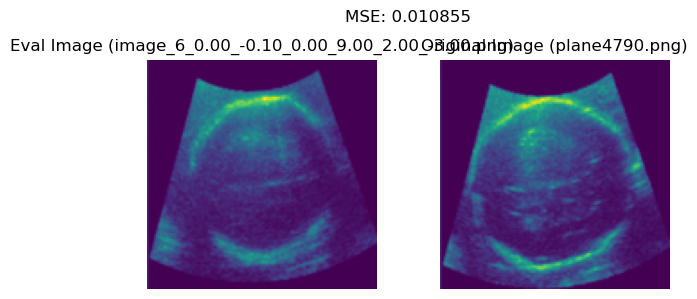

image_51_0.00_-0.15_0.00_3.00_6.00_-15.00.png 0.00 -0.15 0.00 3.00 6.00 -15.00
 image_51_0.00_-0.15_0.00_3.00_6.00_-15.00.png,  MSE: 0.000078


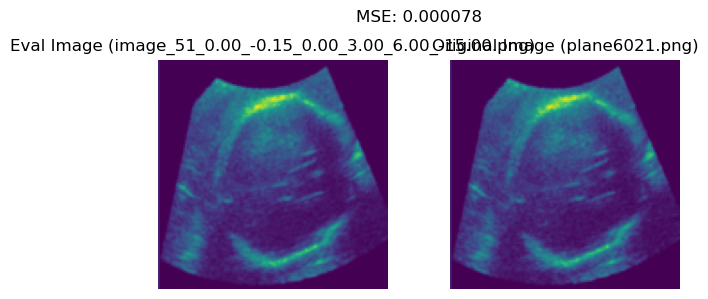

image_41_0.00_0.05_0.00_-9.00_-10.00_3.00.png 0.00 0.05 0.00 -9.00 -10.00 3.00
No match found in CSV for x=0.00
image_21_0.00_-0.05_0.00_-15.00_2.00_3.00.png 0.00 -0.05 0.00 -15.00 2.00 3.00
No match found in CSV for x=0.00
image_47_0.00_-0.10_0.00_-15.00_6.00_3.00.png 0.00 -0.10 0.00 -15.00 6.00 3.00
 image_47_0.00_-0.10_0.00_-15.00_6.00_3.00.png,  MSE: 0.000080


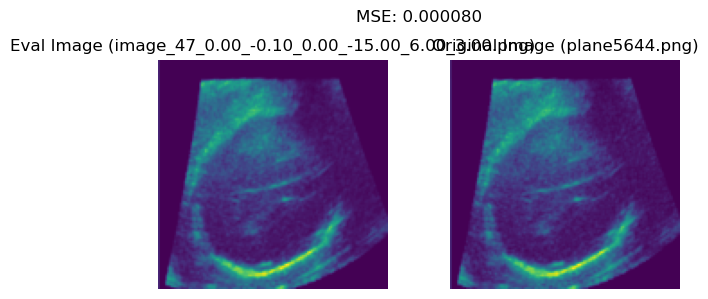

image_54_0.00_0.10_0.00_-9.00_-6.00_-9.00.png 0.00 0.10 0.00 -9.00 -6.00 -9.00
No match found in CSV for x=0.00
image_39_0.00_0.15_0.00_-15.00_6.00_-9.00.png 0.00 0.15 0.00 -15.00 6.00 -9.00
 image_39_0.00_0.15_0.00_-15.00_6.00_-9.00.png,  MSE: 0.000082


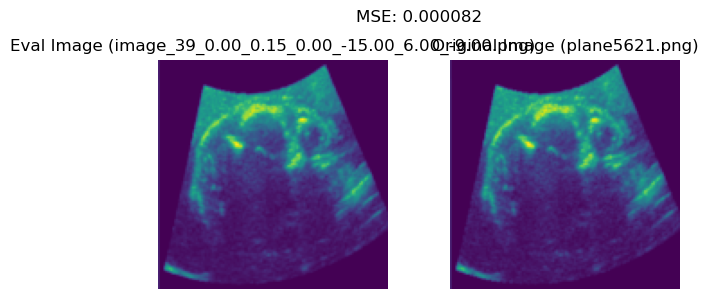

image_31_0.00_0.10_0.00_-9.00_-6.00_-15.00.png 0.00 0.10 0.00 -9.00 -6.00 -15.00
No match found in CSV for x=0.00
image_13_0.00_-0.05_0.00_-3.00_2.00_-9.00.png 0.00 -0.05 0.00 -3.00 2.00 -9.00
No match found in CSV for x=0.00
image_33_0.00_0.10_0.00_-3.00_-6.00_-3.00.png 0.00 0.10 0.00 -3.00 -6.00 -3.00
No match found in CSV for x=0.00
image_14_0.00_-0.00_0.00_9.00_6.00_9.00.png 0.00 -0.00 0.00 9.00 6.00 9.00
No match found in CSV for x=0.00
image_23_0.00_-0.10_0.00_-15.00_2.00_-9.00.png 0.00 -0.10 0.00 -15.00 2.00 -9.00
 image_23_0.00_-0.10_0.00_-15.00_2.00_-9.00.png,  MSE: 0.000068


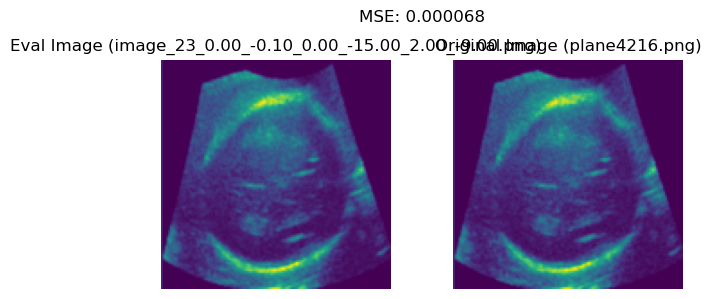

image_42_0.00_0.10_0.00_-15.00_2.00_-15.00.png 0.00 0.10 0.00 -15.00 2.00 -15.00
No match found in CSV for x=0.00
image_32_0.00_-0.00_0.00_9.00_6.00_3.00.png 0.00 -0.00 0.00 9.00 6.00 3.00
No match found in CSV for x=0.00
image_28_0.00_-0.15_0.00_3.00_2.00_9.00.png 0.00 -0.15 0.00 3.00 2.00 9.00
 image_28_0.00_-0.15_0.00_3.00_2.00_9.00.png,  MSE: 0.000052


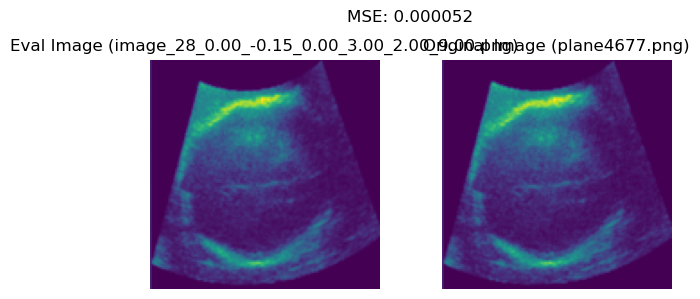

image_45_0.00_-0.05_0.00_-9.00_6.00_-3.00.png 0.00 -0.05 0.00 -9.00 6.00 -3.00
No match found in CSV for x=0.00


In [116]:
# === Paths ===
# csv_path = "dataset_Vol3_3_random32/poses_unity.csv"
csv_path = "dataset_Vol3_2/poses_unity.csv"

original_images_dir = "dataset_Vol3_2/images"
# original_images_dir = "dataset_Vol3_3_random32/images"


eval_images_dir = "show_results_3d_usvol3_2_v3"





# eval_images_dir = "show_results_3d_usvol3_3_cont"
# eval_images_dir = "show_results_3d_usvol3_2_v3_dataset_Vol3_3_random32"


results = show_and_calculate_results(csv_path, original_images_dir, eval_images_dir, plot_images = True)





In [19]:
results["MSE"].mean()

np.float64(0.0028081749944249166)

In [113]:
csv_path = "dataset_Vol3_2/poses_unity.csv"
original_images_dir = "dataset_Vol3_2/images"


# eval_images_dir_list = ["show_results_3d_usvol3_2_v2", "show_results_3d_usvol3_2_v3",
#                         "show_results_3d_usvol_1", "show_results_3d_usvol3_1_128_again",
#                         "show_results_3d_usvol3_3_cont"]


# The best
eval_images_dir_list = ["show_results_3d_usvol3_2_v3", "show_results_3d_usvol3_2_v4",
                        "show_results_3d_usvol3_3_cont"]


results_list = []



for eval_images_dir in eval_images_dir_list:

    results = show_and_calculate_results(csv_path, original_images_dir, eval_images_dir, plot_images = False)

    # print(eval_images_dir, results["MSE"].mean())
    results_list.append([eval_images_dir, results["MSE"].mean()])

image_10_0.00_0.15_0.00_9.00_6.00_9.00.png 0.00 0.15 0.00 9.00 6.00 9.00
 image_10_0.00_0.15_0.00_9.00_6.00_9.00.png,  MSE: 0.000083
image_63_0.00_-0.00_0.00_3.00_6.00_9.00.png 0.00 -0.00 0.00 3.00 6.00 9.00
No match found in CSV for x=0.00
image_38_0.00_0.05_0.00_9.00_-10.00_-15.00.png 0.00 0.05 0.00 9.00 -10.00 -15.00
No match found in CSV for x=0.00
image_29_0.00_-0.10_0.00_9.00_-6.00_9.00.png 0.00 -0.10 0.00 9.00 -6.00 9.00
 image_29_0.00_-0.10_0.00_9.00_-6.00_9.00.png,  MSE: 0.000058
image_24_0.00_0.05_0.00_9.00_2.00_-3.00.png 0.00 0.05 0.00 9.00 2.00 -3.00
No match found in CSV for x=0.00
image_30_0.00_-0.05_0.00_-9.00_6.00_-15.00.png 0.00 -0.05 0.00 -9.00 6.00 -15.00
No match found in CSV for x=0.00
image_37_0.00_-0.05_0.00_-15.00_-2.00_9.00.png 0.00 -0.05 0.00 -15.00 -2.00 9.00
No match found in CSV for x=0.00
image_0_0.00_-0.10_0.00_9.00_-10.00_-15.00.png 0.00 -0.10 0.00 9.00 -10.00 -15.00
 image_0_0.00_-0.10_0.00_9.00_-10.00_-15.00.png,  MSE: 0.000072
image_59_0.00_0.15_0.00_

In [114]:
results_list

[['show_results_3d_usvol3_3', nan],
 ['show_results_3d_usvol3_2_v3', np.float64(0.0005773511653387686)],
 ['show_results_3d_usvol3_2_v4', np.float64(0.0015166898938332452)],
 ['show_results_3d_usvol3_3_cont', np.float64(0.0028081749944249166)]]

In [6]:
csv_path = "dataset_Vol3_4/poses_unity.csv"
original_images_dir = "dataset_Vol3_4/images"


# eval_images_dir_list = ["show_results_3d_usvol3_2_v2", "show_results_3d_usvol3_2_v3",
#                         "show_results_3d_usvol_1", "show_results_3d_usvol3_1_128_again",
#                         "show_results_3d_usvol3_3_cont"]


# The best
eval_images_dir_list = ["show_results_3d_usvol3_ds4_1", "show_results_3d_usvol3_ds4_2"]


results_list = []



for eval_images_dir in eval_images_dir_list:

    results = show_and_calculate_results(csv_path, original_images_dir, eval_images_dir, plot_images = False)

    # print(eval_images_dir, results["MSE"].mean())
    results_list.append([eval_images_dir, results["MSE"].mean()])

image_71_0.00_-0.10_0.00_15.00_12.00_6.00.png 0.00 -0.10 0.00 15.00 12.00 6.00
No match found in CSV for x=0.00
image_86_-0.01_0.15_-0.01_-3.00_9.00_9.00.png -0.01 0.15 -0.01 -3.00 9.00 9.00
 image_86_-0.01_0.15_-0.01_-3.00_9.00_9.00.png,  MSE: 0.022476
image_11_0.00_-0.10_0.00_-3.00_0.00_15.00.png 0.00 -0.10 0.00 -3.00 0.00 15.00
No match found in CSV for x=0.00
image_115_0.00_0.15_0.00_-12.00_15.00_12.00.png 0.00 0.15 0.00 -12.00 15.00 12.00
 image_115_0.00_0.15_0.00_-12.00_15.00_12.00.png,  MSE: 0.030481
image_2_0.00_0.15_0.00_-3.00_-9.00_-3.00.png 0.00 0.15 0.00 -3.00 -9.00 -3.00
 image_2_0.00_0.15_0.00_-3.00_-9.00_-3.00.png,  MSE: 0.017249
image_35_0.01_0.10_0.01_-9.00_3.00_15.00.png 0.01 0.10 0.01 -9.00 3.00 15.00
 image_35_0.01_0.10_0.01_-9.00_3.00_15.00.png,  MSE: 0.025417
image_74_0.00_0.10_0.00_-6.00_-15.00_12.00.png 0.00 0.10 0.00 -6.00 -15.00 12.00
 image_74_0.00_0.10_0.00_-6.00_-15.00_12.00.png,  MSE: 0.027377
image_43_0.00_-0.05_0.00_-9.00_15.00_-6.00.png 0.00 -0.05 0.00 

In [7]:
results_list

[['show_results_3d_usvol3_ds4_1', np.float64(0.019893397707049405)],
 ['show_results_3d_usvol3_ds4_2', np.float64(0.019094762858003378)]]

In [3]:
def my_make_grid(images, rows, cols):
    # w, h = images[0,0,:,:].size
    # w=64
    # h=64
    # grid = Image.new("RGB", size=(cols * w, rows * h))
    # for i, image in enumerate(images):
    #     grid.paste(image, box=(i % cols * w, i // cols * h))
    # return grid

    grid = make_grid(images, nrow=3, padding=2, normalize=True)

    # Convert to RGB PIL image
    grid_pil = to_pil_image(grid)
    return grid_pil


# === Image Transform ===
to_tensor = T.ToTensor()  # Converts PIL image to [0,1] float tensor
to_pil = T.ToPILImage()


# === Comparison Metric: Mean Squared Error ===
def mse(img1, img2):
    return F.mse_loss(img1, img2).item()





def show_and_calculate_results_random32(csv_path, original_images_dir, eval_images_dir, plot_images):

    df = pd.read_csv(csv_path)


    eval_images = []
    original_images = []

    results_list = []


    # vector_input_list = []
    # for index, row in df.iterrows():
    #     print(index, row)

    #     values = row.values[1:]
    #     print(values)
    #     vector_input_list.append(values)





    for filename in os.listdir(eval_images_dir):
        if filename.startswith("image_") and filename.endswith(".png"):
        # Extract X from "image_X.png"
            x_value = filename.split("_")[2]
            y_value = filename.split("_")[3]
            z_value = filename.split("_")[4]

            x_rot_value = filename.split("_")[5]
            y_rot_value = filename.split("_")[6]
            z_rot_value = filename.split("_")[7][:-4]



            print(filename, x_value, y_value, z_value, x_rot_value, y_rot_value, z_rot_value)


            # match = df.query(f'pos_x == {int(float(x_value))} & pos_y  == {y_value} & pos_z  == {z_value} & rot_x == {x_rot_value} & rot_y  == {y_rot_value} & rot_z  == {z_rot_value}')

            match = df.query(f'pos_x == {float(x_value)} & pos_y  == {float(y_value)} & pos_z  == {float(z_value)} & rot_x == {float(x_rot_value)} & rot_y  == {float(y_rot_value)} & rot_z  == {float(z_rot_value)}')

            original_filename = match.iloc[0]['filename']
            print("original_filename ", original_filename)


            eval_img_path = os.path.join(eval_images_dir, filename)
            original_img_path = os.path.join(original_images_dir, original_filename)

            # Load images
            try:
                eval_img = to_tensor(Image.open(eval_img_path).convert("L"))
                original_img = to_tensor(Image.open(original_img_path).convert("L"))

                # Resize original to match small image size (if needed)
                if original_img.shape != eval_img.shape:
                    original_img = T.Resize(eval_img.shape[1:])(original_img)


                # Compute MSE
                error = mse(eval_img, original_img)
                print(f" {original_filename},  MSE: {error:.6f}")

                results_list.append([original_filename,error])


                eval_images.append(eval_img)
                original_images.append(original_img)

            

                if plot_images:
                    fig, axes = plt.subplots(1, 2, figsize=(6, 3))
                    axes[0].imshow(to_pil(eval_img))
                    axes[0].set_title(f"Eval Image :\n ({filename})")
                    axes[0].axis("off")

                    axes[1].imshow(to_pil(original_img))
                    axes[1].set_title(f"Original Image ({original_filename})")
                    axes[1].axis("off")

                    plt.suptitle(f"MSE: {error:.6f}")
                    plt.tight_layout()
                    plt.show()

            except Exception as e:
                print(f"Error processing {filename}: {e}")


    results_df = pd.DataFrame(results_list, columns=["filename", "MSE"])

    return results_df
# if eval_images and original_images:
#     grid_eval = make_grid(eval_images, nrow=4, padding=4)
#     grid_original = make_grid(original_images, nrow=4, padding=4)

#     grid_eval = to_pil_image(grid_eval)
#     grid_original = to_pil_image(grid_original)

    # grid_eval.save(f"grid_eval.png")
    # grid_original.save(f"grid_original.png")

image_38_0.00_0.10_0.00_10.00_2.00_-2.00.png 0.00 0.10 0.00 10.00 2.00 -2.00
 image_38_0.00_0.10_0.00_10.00_2.00_-2.00.png,  MSE: 0.000190


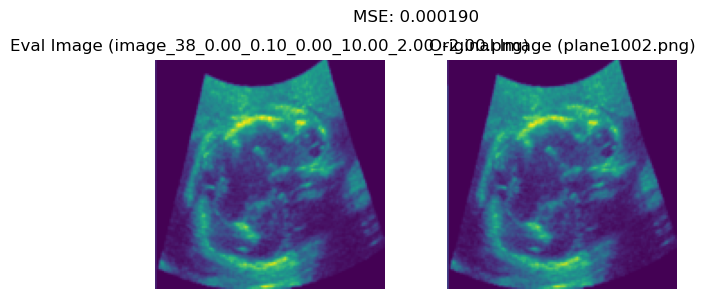

image_15_0.00_0.10_0.00_2.00_-6.00_-8.00.png 0.00 0.10 0.00 2.00 -6.00 -8.00
 image_15_0.00_0.10_0.00_2.00_-6.00_-8.00.png,  MSE: 0.014825


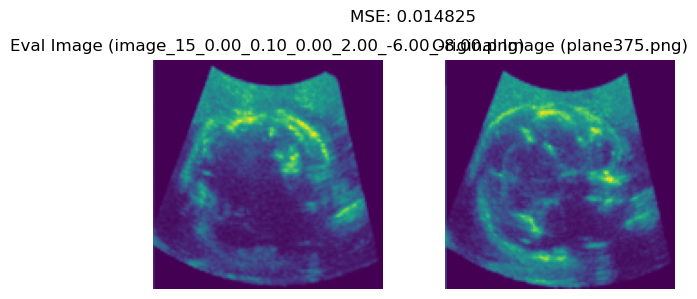

image_17_0.00_0.10_0.00_4.00_-6.00_-6.00.png 0.00 0.10 0.00 4.00 -6.00 -6.00
 image_17_0.00_0.10_0.00_4.00_-6.00_-6.00.png,  MSE: 0.000156


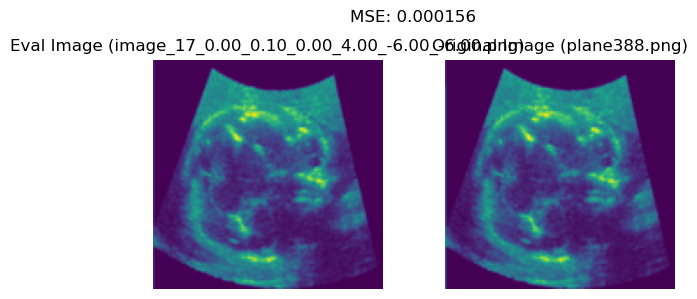

image_49_0.00_0.10_0.00_2.00_8.00_8.00.png 0.00 0.10 0.00 2.00 8.00 8.00
 image_49_0.00_0.10_0.00_2.00_8.00_8.00.png,  MSE: 0.000169


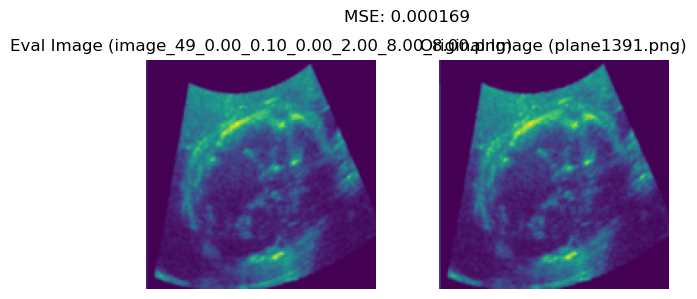

image_5_0.00_0.10_0.00_-4.00_-10.00_2.00.png 0.00 0.10 0.00 -4.00 -10.00 2.00
 image_5_0.00_0.10_0.00_-4.00_-10.00_2.00.png,  MSE: 0.000562


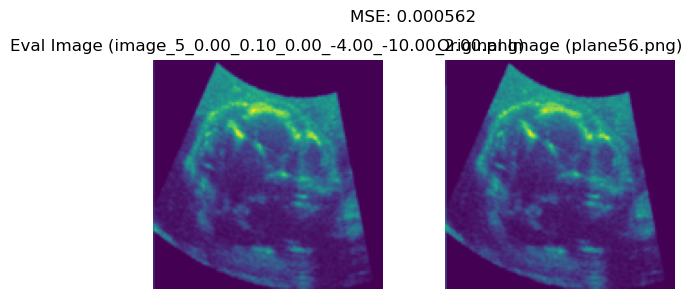

image_9_0.00_0.10_0.00_10.00_-10.00_-2.00.png 0.00 0.10 0.00 10.00 -10.00 -2.00
 image_9_0.00_0.10_0.00_10.00_-10.00_-2.00.png,  MSE: 0.013368


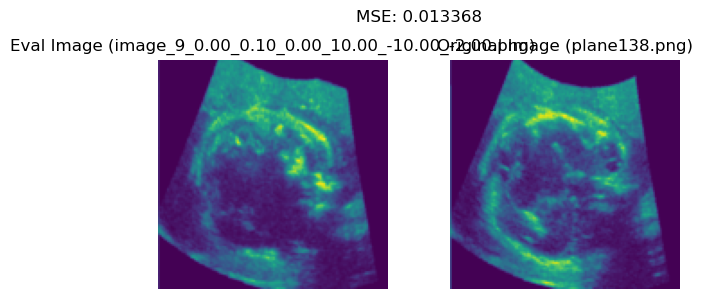

image_20_0.00_0.10_0.00_6.00_-6.00_10.00.png 0.00 0.10 0.00 6.00 -6.00 10.00
 image_20_0.00_0.10_0.00_6.00_-6.00_10.00.png,  MSE: 0.000541


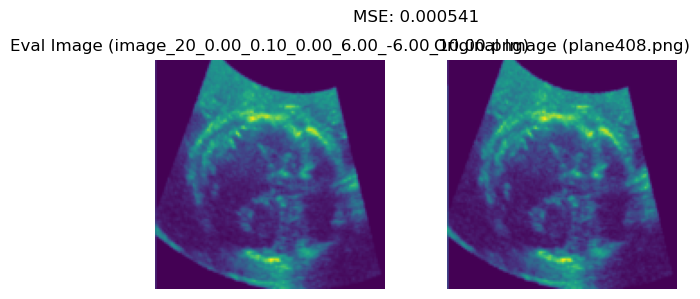

image_2_0.00_0.10_0.00_-8.00_-10.00_-2.00.png 0.00 0.10 0.00 -8.00 -10.00 -2.00
 image_2_0.00_0.10_0.00_-8.00_-10.00_-2.00.png,  MSE: 0.000218


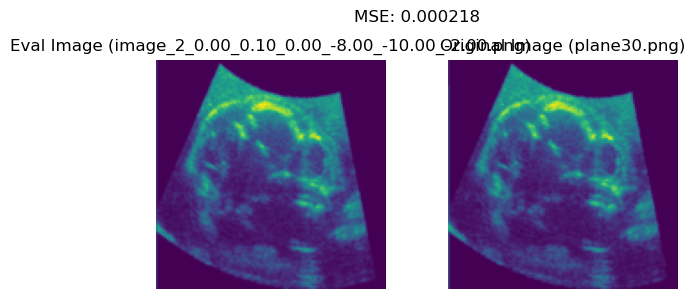

image_39_0.00_0.10_0.00_-12.00_4.00_10.00.png 0.00 0.10 0.00 -12.00 4.00 10.00
 image_39_0.00_0.10_0.00_-12.00_4.00_10.00.png,  MSE: 0.007997


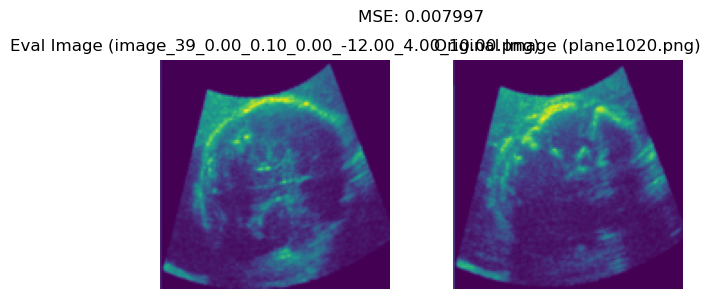

image_43_0.00_0.10_0.00_0.00_6.00_0.00.png 0.00 0.10 0.00 0.00 6.00 0.00
 image_43_0.00_0.10_0.00_0.00_6.00_0.00.png,  MSE: 0.001136


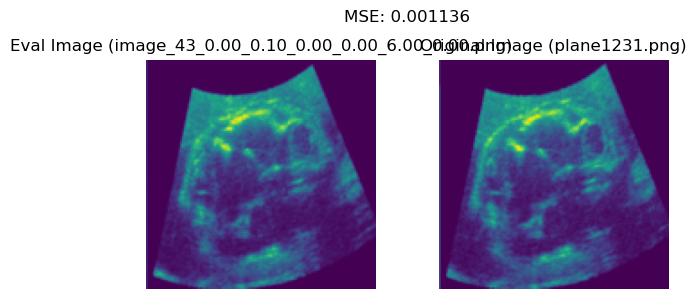

image_51_0.00_0.10_0.00_8.00_8.00_2.00.png 0.00 0.10 0.00 8.00 8.00 2.00
 image_51_0.00_0.10_0.00_8.00_8.00_2.00.png,  MSE: 0.001272


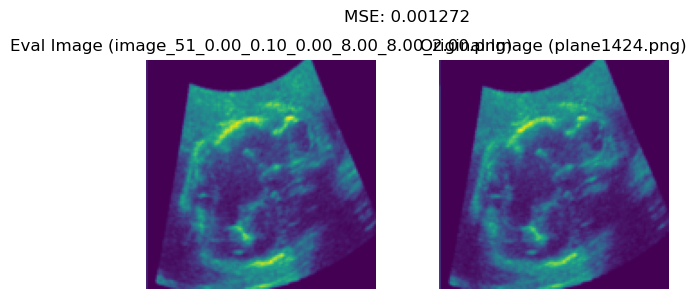

image_4_0.00_0.10_0.00_-4.00_-10.00_-2.00.png 0.00 0.10 0.00 -4.00 -10.00 -2.00
 image_4_0.00_0.10_0.00_-4.00_-10.00_-2.00.png,  MSE: 0.010587


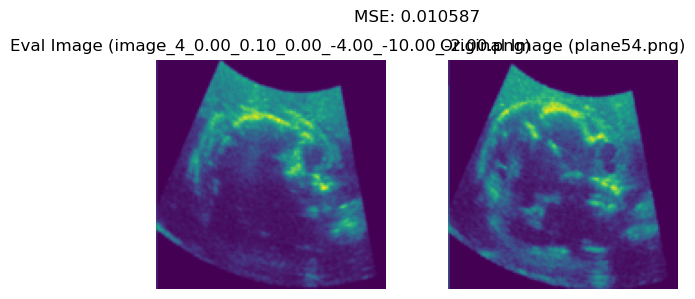

image_42_0.00_0.10_0.00_-2.00_4.00_-10.00.png 0.00 0.10 0.00 -2.00 4.00 -10.00
 image_42_0.00_0.10_0.00_-2.00_4.00_-10.00.png,  MSE: 0.000275


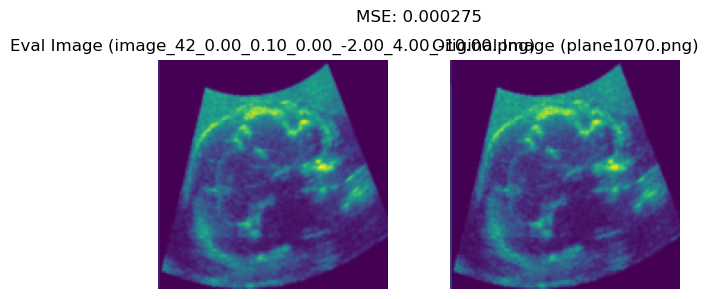

image_30_0.00_0.10_0.00_8.00_-2.00_-2.00.png 0.00 0.10 0.00 8.00 -2.00 -2.00
 image_30_0.00_0.10_0.00_8.00_-2.00_-2.00.png,  MSE: 0.011309


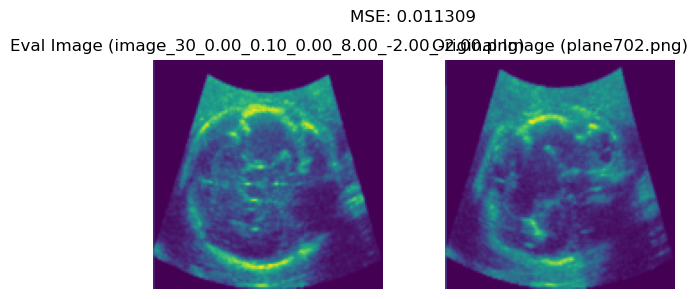

image_7_0.00_0.10_0.00_4.00_-10.00_-4.00.png 0.00 0.10 0.00 4.00 -10.00 -4.00
 image_7_0.00_0.10_0.00_4.00_-10.00_-4.00.png,  MSE: 0.013784


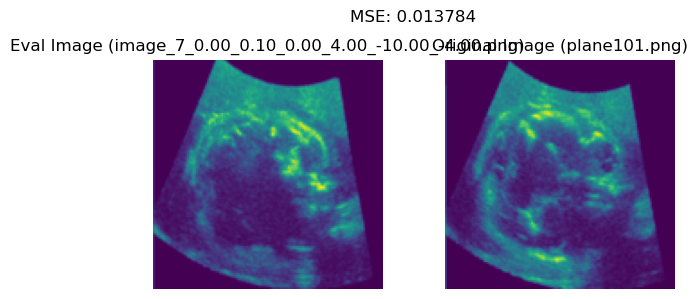

image_6_0.00_0.10_0.00_0.00_-10.00_0.00.png 0.00 0.10 0.00 0.00 -10.00 0.00
 image_6_0.00_0.10_0.00_0.00_-10.00_0.00.png,  MSE: 0.000106


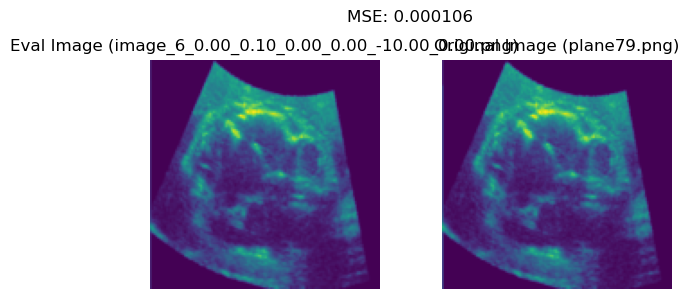

image_45_0.00_0.10_0.00_6.00_6.00_0.00.png 0.00 0.10 0.00 6.00 6.00 0.00
 image_45_0.00_0.10_0.00_6.00_6.00_0.00.png,  MSE: 0.001217


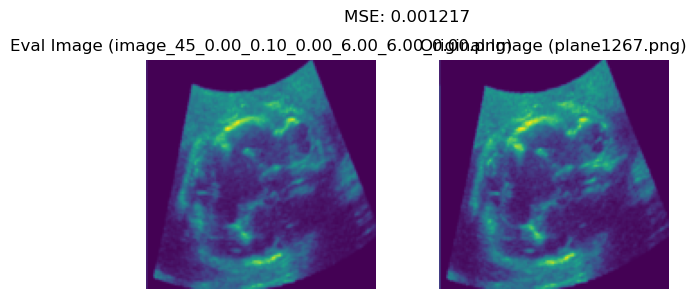

image_26_0.00_0.10_0.00_-10.00_-2.00_-4.00.png 0.00 0.10 0.00 -10.00 -2.00 -4.00
 image_26_0.00_0.10_0.00_-10.00_-2.00_-4.00.png,  MSE: 0.007805


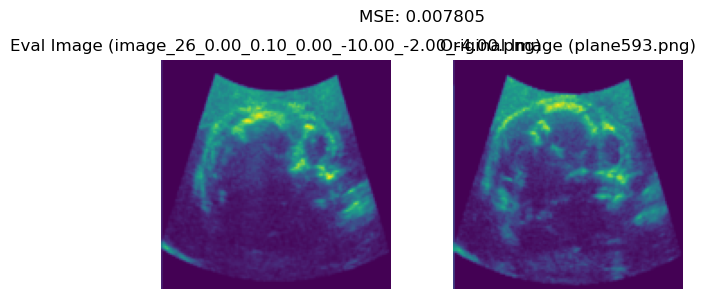

image_40_0.00_0.10_0.00_-8.00_4.00_8.00.png 0.00 0.10 0.00 -8.00 4.00 8.00
 image_40_0.00_0.10_0.00_-8.00_4.00_8.00.png,  MSE: 0.009533


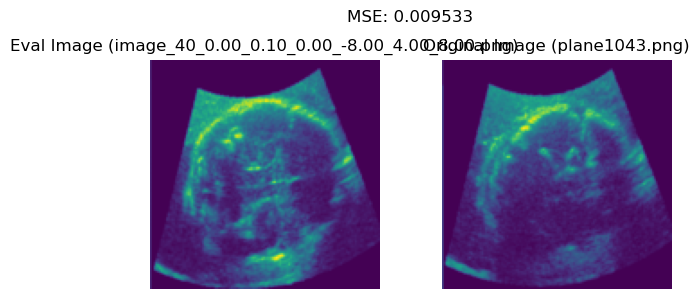

image_11_0.00_0.10_0.00_2.00_-8.00_-8.00.png 0.00 0.10 0.00 2.00 -8.00 -8.00
 image_11_0.00_0.10_0.00_2.00_-8.00_-8.00.png,  MSE: 0.014774


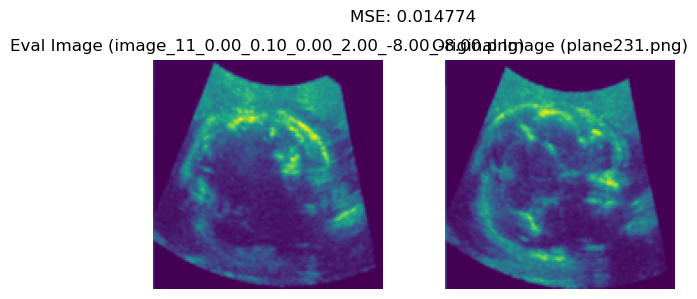

image_24_0.00_0.10_0.00_8.00_-4.00_4.00.png 0.00 0.10 0.00 8.00 -4.00 4.00
 image_24_0.00_0.10_0.00_8.00_-4.00_4.00.png,  MSE: 0.014172


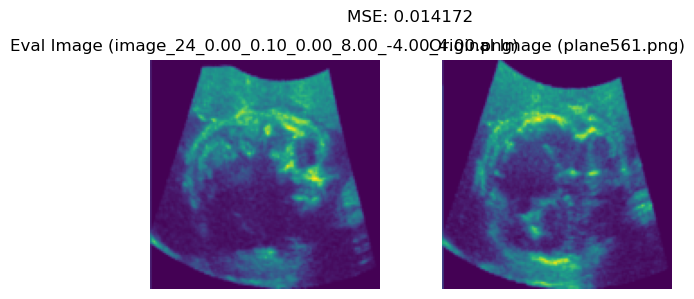

image_48_0.00_0.10_0.00_-2.00_8.00_2.00.png 0.00 0.10 0.00 -2.00 8.00 2.00
 image_48_0.00_0.10_0.00_-2.00_8.00_2.00.png,  MSE: 0.000977


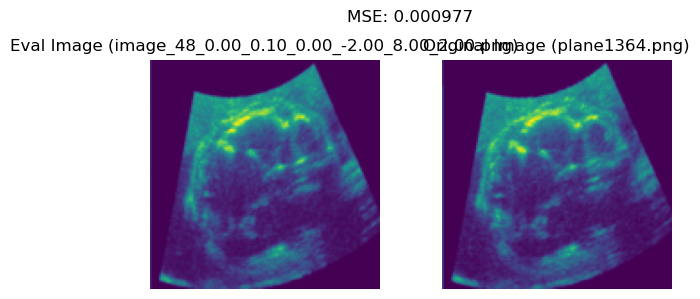

image_50_0.00_0.10_0.00_6.00_8.00_-6.00.png 0.00 0.10 0.00 6.00 8.00 -6.00
 image_50_0.00_0.10_0.00_6.00_8.00_-6.00.png,  MSE: 0.011717


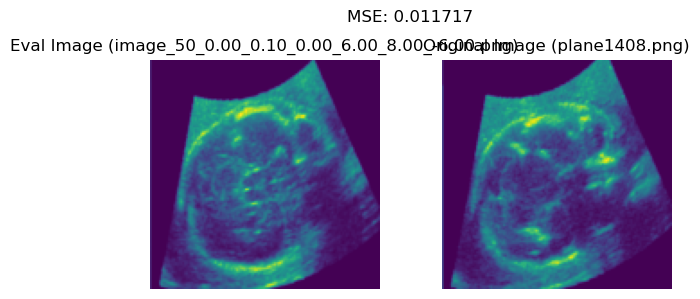

image_16_0.00_0.10_0.00_2.00_-6.00_10.00.png 0.00 0.10 0.00 2.00 -6.00 10.00
 image_16_0.00_0.10_0.00_2.00_-6.00_10.00.png,  MSE: 0.000449


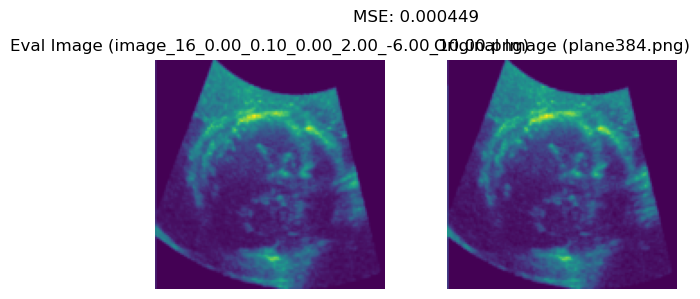

image_25_0.00_0.10_0.00_10.00_-4.00_2.00.png 0.00 0.10 0.00 10.00 -4.00 2.00
 image_25_0.00_0.10_0.00_10.00_-4.00_2.00.png,  MSE: 0.010687


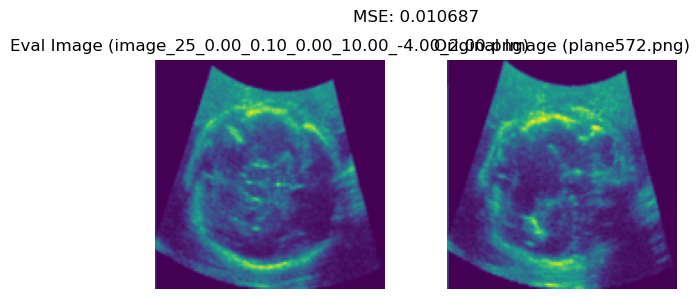

image_32_0.00_0.10_0.00_6.00_0.00_6.00.png 0.00 0.10 0.00 6.00 0.00 6.00
 image_32_0.00_0.10_0.00_6.00_0.00_6.00.png,  MSE: 0.012817


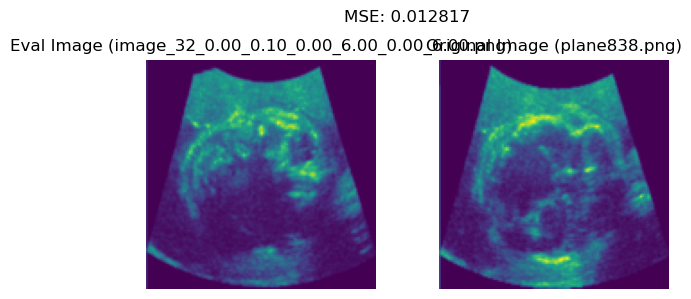

image_23_0.00_0.10_0.00_6.00_-4.00_-4.00.png 0.00 0.10 0.00 6.00 -4.00 -4.00
 image_23_0.00_0.10_0.00_6.00_-4.00_-4.00.png,  MSE: 0.000310


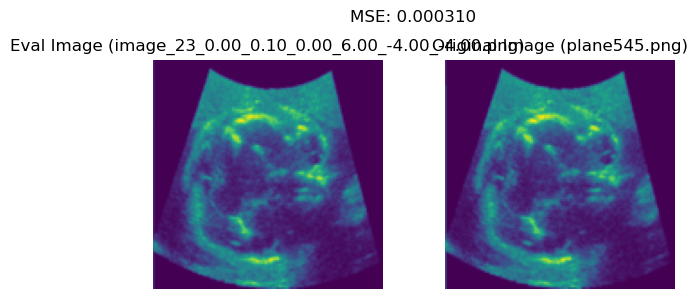

image_21_0.00_0.10_0.00_10.00_-6.00_-10.00.png 0.00 0.10 0.00 10.00 -6.00 -10.00
 image_21_0.00_0.10_0.00_10.00_-6.00_-10.00.png,  MSE: 0.000650


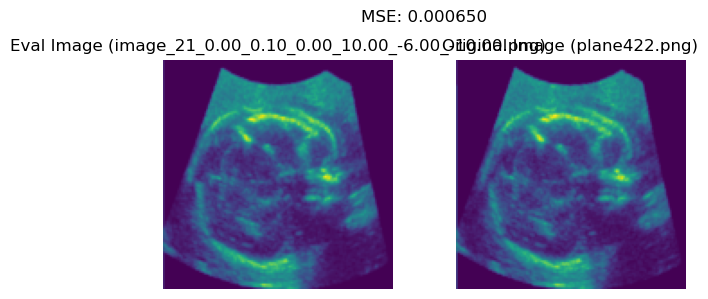

image_44_0.00_0.10_0.00_6.00_6.00_-10.00.png 0.00 0.10 0.00 6.00 6.00 -10.00
 image_44_0.00_0.10_0.00_6.00_6.00_-10.00.png,  MSE: 0.011034


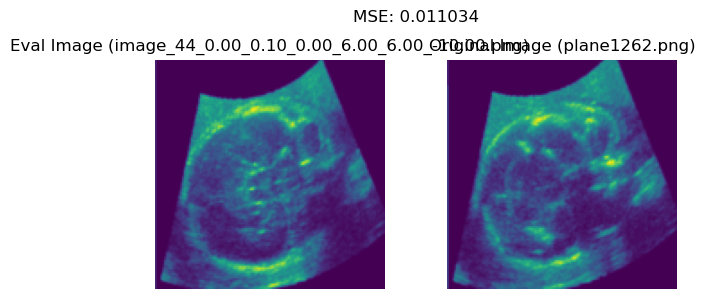

image_46_0.00_0.10_0.00_6.00_6.00_2.00.png 0.00 0.10 0.00 6.00 6.00 2.00
 image_46_0.00_0.10_0.00_6.00_6.00_2.00.png,  MSE: 0.000179


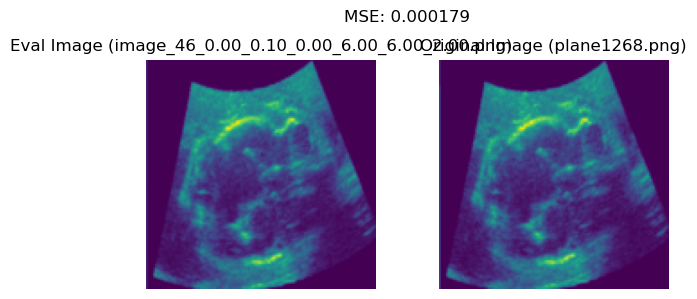

image_35_0.00_0.10_0.00_-4.00_2.00_6.00.png 0.00 0.10 0.00 -4.00 2.00 6.00
 image_35_0.00_0.10_0.00_-4.00_2.00_6.00.png,  MSE: 0.000857


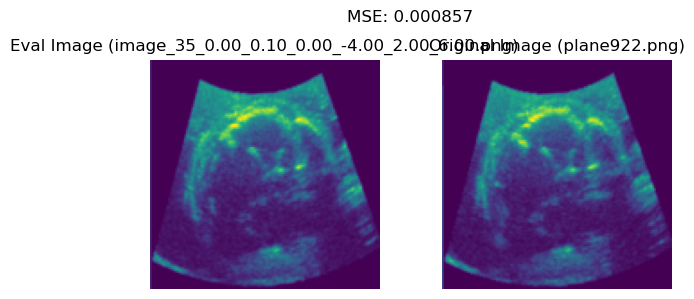

image_29_0.00_0.10_0.00_6.00_-2.00_6.00.png 0.00 0.10 0.00 6.00 -2.00 6.00
 image_29_0.00_0.10_0.00_6.00_-2.00_6.00.png,  MSE: 0.000113


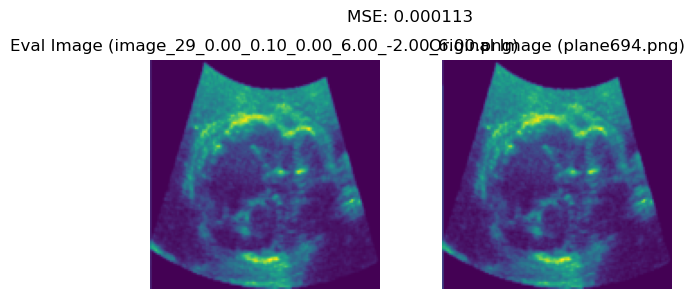

image_8_0.00_0.10_0.00_4.00_-10.00_10.00.png 0.00 0.10 0.00 4.00 -10.00 10.00
 image_8_0.00_0.10_0.00_4.00_-10.00_10.00.png,  MSE: 0.001882


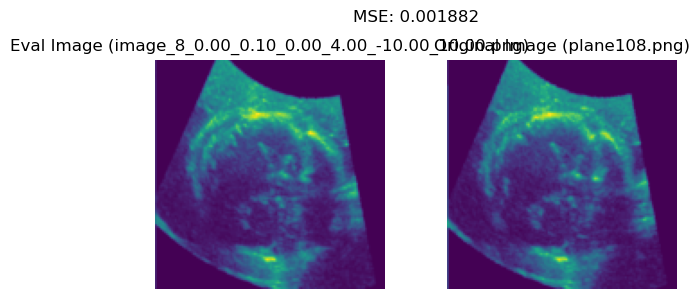

image_41_0.00_0.10_0.00_-4.00_4.00_10.00.png 0.00 0.10 0.00 -4.00 4.00 10.00
 image_41_0.00_0.10_0.00_-4.00_4.00_10.00.png,  MSE: 0.000258


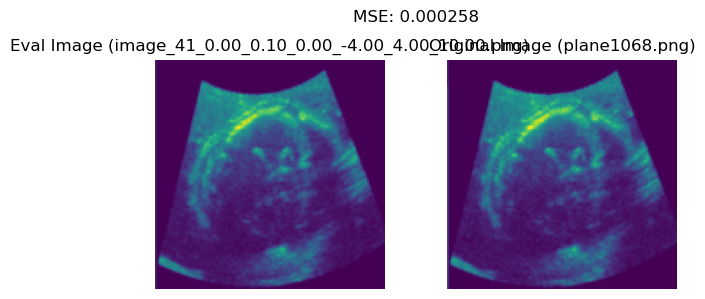

image_0_0.00_0.10_0.00_-10.00_-10.00_-2.00.png 0.00 0.10 0.00 -10.00 -10.00 -2.00
 image_0_0.00_0.10_0.00_-10.00_-10.00_-2.00.png,  MSE: 0.007875


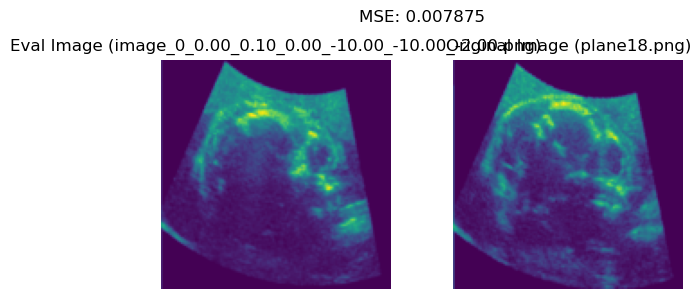

image_13_0.00_0.10_0.00_-12.00_-6.00_-10.00.png 0.00 0.10 0.00 -12.00 -6.00 -10.00
 image_13_0.00_0.10_0.00_-12.00_-6.00_-10.00.png,  MSE: 0.002185


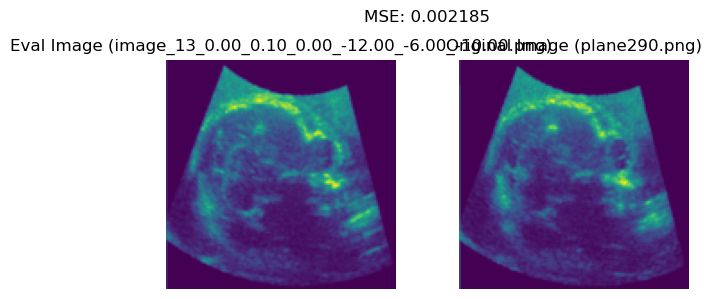

image_37_0.00_0.10_0.00_4.00_2.00_-2.00.png 0.00 0.10 0.00 4.00 2.00 -2.00
 image_37_0.00_0.10_0.00_4.00_2.00_-2.00.png,  MSE: 0.001408


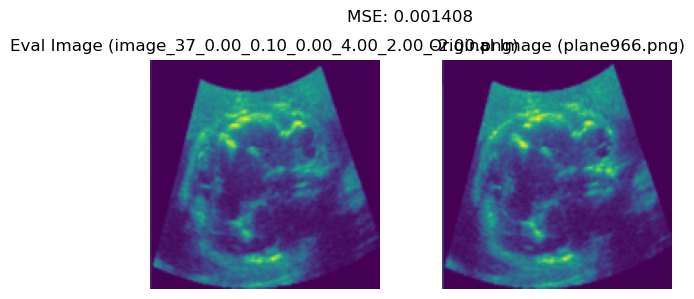

image_33_0.00_0.10_0.00_8.00_0.00_8.00.png 0.00 0.10 0.00 8.00 0.00 8.00
 image_33_0.00_0.10_0.00_8.00_0.00_8.00.png,  MSE: 0.001302


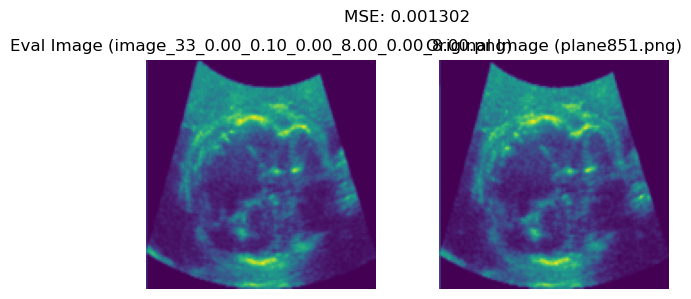

image_14_0.00_0.10_0.00_0.00_-6.00_10.00.png 0.00 0.10 0.00 0.00 -6.00 10.00
 image_14_0.00_0.10_0.00_0.00_-6.00_10.00.png,  MSE: 0.000391


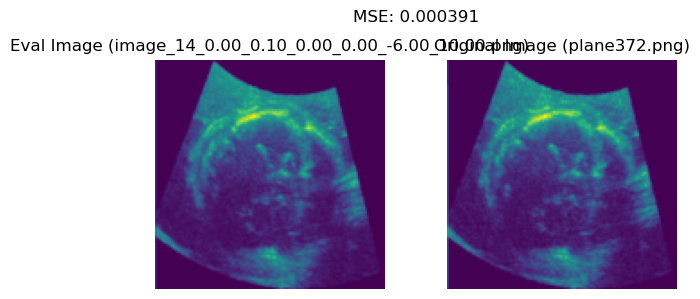

image_19_0.00_0.10_0.00_6.00_-6.00_-10.00.png 0.00 0.10 0.00 6.00 -6.00 -10.00
 image_19_0.00_0.10_0.00_6.00_-6.00_-10.00.png,  MSE: 0.011443


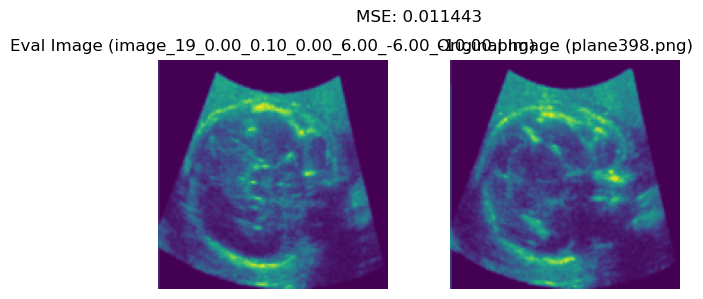

image_27_0.00_0.10_0.00_0.00_-2.00_-6.00.png 0.00 0.10 0.00 0.00 -2.00 -6.00
 image_27_0.00_0.10_0.00_0.00_-2.00_-6.00.png,  MSE: 0.001244


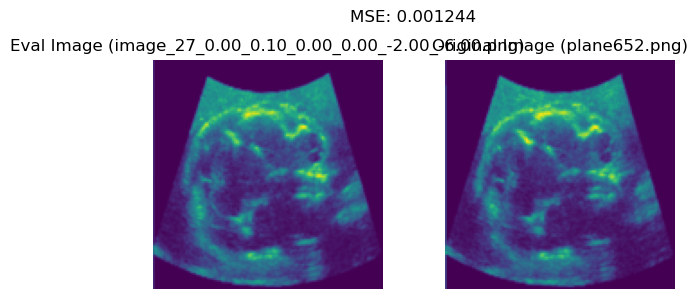

image_28_0.00_0.10_0.00_6.00_-2.00_-6.00.png 0.00 0.10 0.00 6.00 -2.00 -6.00
 image_28_0.00_0.10_0.00_6.00_-2.00_-6.00.png,  MSE: 0.000110


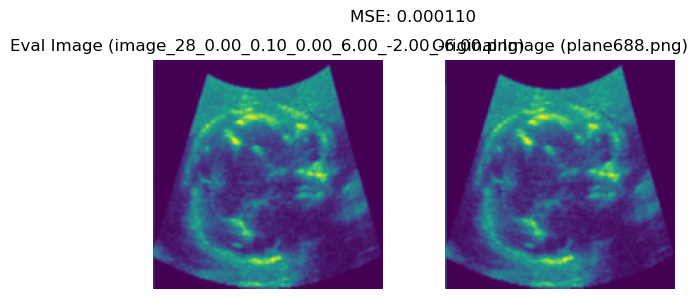

image_10_0.00_0.10_0.00_-12.00_-8.00_2.00.png 0.00 0.10 0.00 -12.00 -8.00 2.00
 image_10_0.00_0.10_0.00_-12.00_-8.00_2.00.png,  MSE: 0.009506


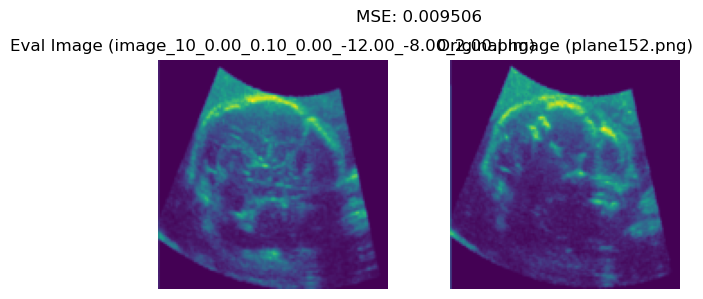

image_34_0.00_0.10_0.00_-10.00_2.00_-12.00.png 0.00 0.10 0.00 -10.00 2.00 -12.00
 image_34_0.00_0.10_0.00_-10.00_2.00_-12.00.png,  MSE: 0.016215


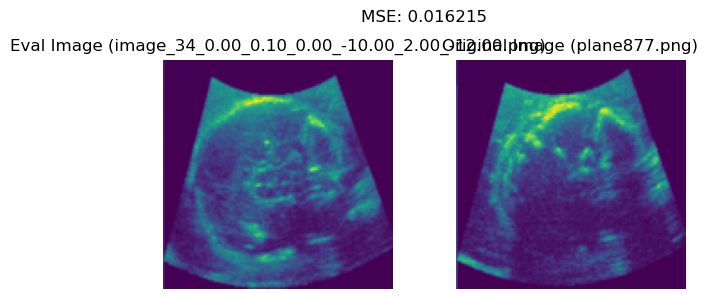

image_12_0.00_0.10_0.00_10.00_-8.00_10.00.png 0.00 0.10 0.00 10.00 -8.00 10.00
 image_12_0.00_0.10_0.00_10.00_-8.00_10.00.png,  MSE: 0.017154


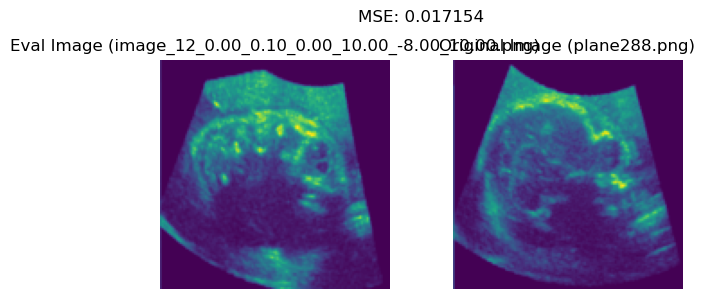

image_22_0.00_0.10_0.00_0.00_-4.00_0.00.png 0.00 0.10 0.00 0.00 -4.00 0.00
 image_22_0.00_0.10_0.00_0.00_-4.00_0.00.png,  MSE: 0.000100


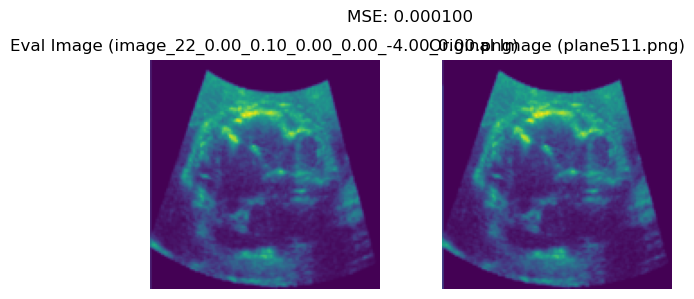

image_18_0.00_0.10_0.00_4.00_-6.00_6.00.png 0.00 0.10 0.00 4.00 -6.00 6.00
 image_18_0.00_0.10_0.00_4.00_-6.00_6.00.png,  MSE: 0.000147


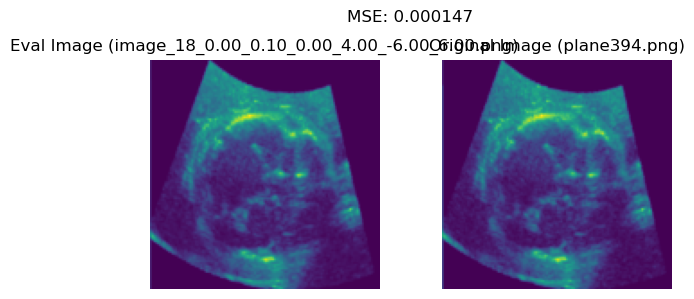

image_1_0.00_0.10_0.00_-10.00_-10.00_6.00.png 0.00 0.10 0.00 -10.00 -10.00 6.00
 image_1_0.00_0.10_0.00_-10.00_-10.00_6.00.png,  MSE: 0.000135


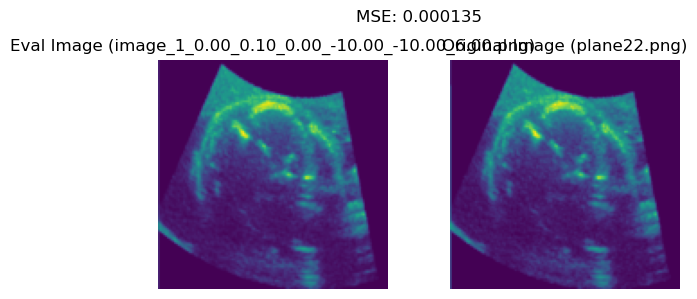

image_3_0.00_0.10_0.00_-6.00_-10.00_0.00.png 0.00 0.10 0.00 -6.00 -10.00 0.00
 image_3_0.00_0.10_0.00_-6.00_-10.00_0.00.png,  MSE: 0.000112


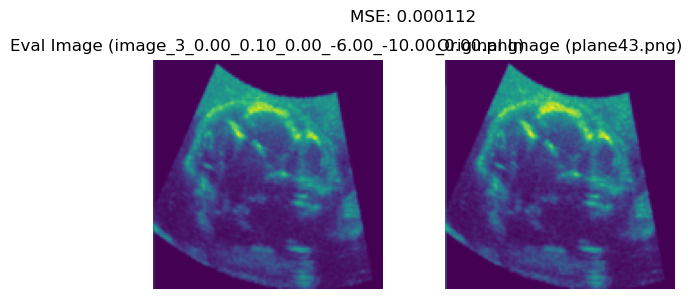

image_47_0.00_0.10_0.00_-8.00_8.00_6.00.png 0.00 0.10 0.00 -8.00 8.00 6.00
 image_47_0.00_0.10_0.00_-8.00_8.00_6.00.png,  MSE: 0.008343


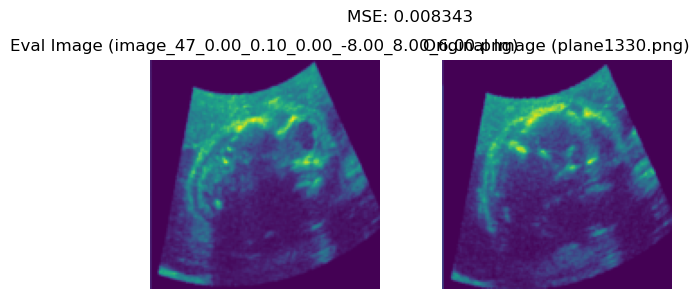

image_31_0.00_0.10_0.00_10.00_-2.00_6.00.png 0.00 0.10 0.00 10.00 -2.00 6.00
 image_31_0.00_0.10_0.00_10.00_-2.00_6.00.png,  MSE: 0.001385


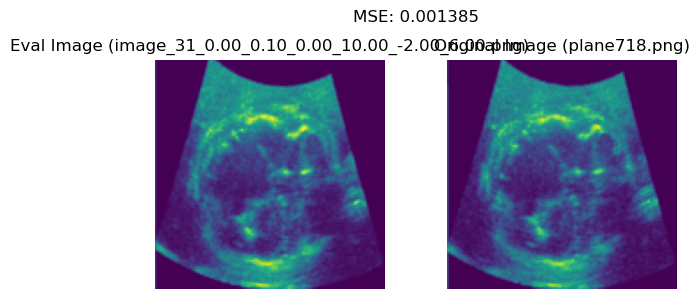

image_36_0.00_0.10_0.00_-2.00_2.00_-6.00.png 0.00 0.10 0.00 -2.00 2.00 -6.00
 image_36_0.00_0.10_0.00_-2.00_2.00_-6.00.png,  MSE: 0.001196


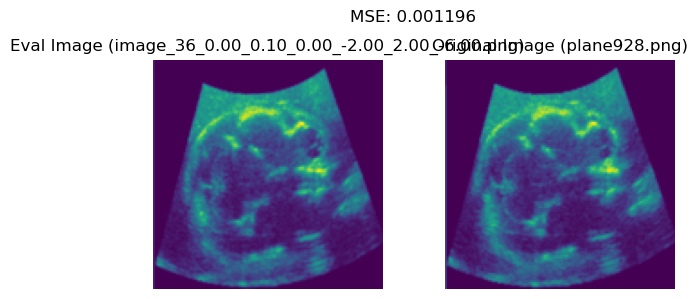

In [119]:
csv_path = "dataset_Vol3_3_random32/poses_unity.csv"
original_images_dir = "dataset_Vol3_3_random32/images"


eval_images_dir = "show_results_3d_usvol3_2_v3_dataset_Vol3_3_random32"

results = show_and_calculate_results(csv_path, original_images_dir, eval_images_dir, plot_images = True)

# results['MSE'].hist()


In [108]:
csv_path = "dataset_Vol3_3_random32/poses_unity.csv"
original_images_dir = "dataset_Vol3_3_random32/images"


# eval_images_dir = "show_results_3d_usvol3_2_v3_dataset_Vol3_3_random32"


eval_images_dir_list = ["show_results_3d_usvol3_2_v3_dataset_Vol3_3_random32", 
                        "show_results_3d_usvol3_2_v4_dataset_Vol3_3_random32"]


results_list = []


for eval_images_dir in eval_images_dir_list:

    results = show_and_calculate_results(csv_path, original_images_dir, eval_images_dir, plot_images = False)

    # print(eval_images_dir, results["MSE"].mean())
    results_list.append([eval_images_dir, results["MSE"].mean()])

image_38_0.00_0.10_0.00_10.00_2.00_-2.00.png 0.00 0.10 0.00 10.00 2.00 -2.00
 image_38_0.00_0.10_0.00_10.00_2.00_-2.00.png,  MSE: 0.000190
image_15_0.00_0.10_0.00_2.00_-6.00_-8.00.png 0.00 0.10 0.00 2.00 -6.00 -8.00
 image_15_0.00_0.10_0.00_2.00_-6.00_-8.00.png,  MSE: 0.014825
image_17_0.00_0.10_0.00_4.00_-6.00_-6.00.png 0.00 0.10 0.00 4.00 -6.00 -6.00
 image_17_0.00_0.10_0.00_4.00_-6.00_-6.00.png,  MSE: 0.000156
image_49_0.00_0.10_0.00_2.00_8.00_8.00.png 0.00 0.10 0.00 2.00 8.00 8.00
 image_49_0.00_0.10_0.00_2.00_8.00_8.00.png,  MSE: 0.000169
image_5_0.00_0.10_0.00_-4.00_-10.00_2.00.png 0.00 0.10 0.00 -4.00 -10.00 2.00
 image_5_0.00_0.10_0.00_-4.00_-10.00_2.00.png,  MSE: 0.000562
image_9_0.00_0.10_0.00_10.00_-10.00_-2.00.png 0.00 0.10 0.00 10.00 -10.00 -2.00
 image_9_0.00_0.10_0.00_10.00_-10.00_-2.00.png,  MSE: 0.013368
image_20_0.00_0.10_0.00_6.00_-6.00_10.00.png 0.00 0.10 0.00 6.00 -6.00 10.00
 image_20_0.00_0.10_0.00_6.00_-6.00_10.00.png,  MSE: 0.000541
image_2_0.00_0.10_0.00_-8.00

In [109]:
results_list

[['show_results_3d_usvol3_2_v3_dataset_Vol3_3_random32',
  np.float64(0.004926440318740788)],
 ['show_results_3d_usvol3_2_v4_dataset_Vol3_3_random32',
  np.float64(0.006826979454602294)]]

In [82]:
df = pd.read_csv(csv_path)
df[df['id'] == 'plane1002.png']

,id,pos_x,pos_y,pos_z,rot_x,rot_y,rot_z
1001,plane1002.png,0,0.1,0,10,2,-2


In [85]:
match = df.query(f'pos_x == {int(float(0))} & pos_y  == {int(float(0.1))} & pos_z  == {int(float(0.00))} & rot_x == {int(float(10.0))} & rot_y  == {int(float(2.00))} & rot_z  == {int(float(-2.00))}')
match

,id,pos_x,pos_y,pos_z,rot_x,rot_y,rot_z


In [37]:
df = pd.read_csv("dataset_Vol3_2/poses_unity.csv")
df.shape

(7000, 7)

In [38]:
df

,filename,pos_x,pos_y,pos_z,rot_x,rot_y,rot_z
0,plane1.png,0,-1.500000e-01,0,-15,-10,-15
1,plane2.png,0,-1.000000e-01,0,-15,-10,-15
2,plane3.png,0,-5.000001e-02,0,-15,-10,-15
3,plane4.png,0,-7.450581e-09,0,-15,-10,-15
4,plane5.png,0,4.999999e-02,0,-15,-10,-15
...,...,...,...,...,...,...,...
6995,plane6996.png,0,-5.000001e-02,0,12,8,12
6996,plane6997.png,0,-7.450581e-09,0,12,8,12
6997,plane6998.png,0,4.999999e-02,0,12,8,12
6998,plane6999.png,0,9.999999e-02,0,12,8,12


In [39]:
df["pos_y"].unique()

array([-1.500000e-01, -1.000000e-01, -5.000001e-02, -7.450581e-09,
        4.999999e-02,  9.999999e-02,  1.500000e-01])

In [40]:
print(df["rot_x"].unique())
print(df["rot_y"].unique())
print(df["rot_z"].unique())

[-15 -12  -9  -6  -3   0   3   6   9  12]
[-10  -8  -6  -4  -2   0   2   4   6   8]
[-15 -12  -9  -6  -3   0   3   6   9  12]


In [138]:
x_pos = np.arange(-0.01, 0.011, step=0.01)
y_pos = np.arange(-0.15, 0.151, step=0.1)
z_pos = np.arange(-0.01, 0.011, step=0.01)

x_rot = np.arange(-15, 15.01,step=3)
y_rot = np.arange(-15, 15.01,step=3)
z_rot = np.arange(-15, 15.01,step=3)


print(x_pos)
print(y_pos)
print(z_pos)

print(x_rot)
print(y_rot)
print(z_rot)


print(len(x_pos) * len(y_pos) * len(z_pos) * len(x_rot) * len(y_rot) * len(z_rot))

[-0.01  0.    0.01]
[-0.15 -0.05  0.05  0.15]
[-0.01  0.    0.01]
[-15. -12.  -9.  -6.  -3.   0.   3.   6.   9.  12.  15.]
[-15. -12.  -9.  -6.  -3.   0.   3.   6.   9.  12.  15.]
[-15. -12.  -9.  -6.  -3.   0.   3.   6.   9.  12.  15.]
47916


Torch version: 2.7.0+cu118
Torch using 4 threads.
Available devices: {0: 'NVIDIA A100 80GB PCIe', 1: 'NVIDIA A100 80GB PCIe', 2: 'NVIDIA A100 80GB PCIe'}
***Device - cuda:1 setup:***
	Cuda available: True, device: cuda:1 num. devices: 3, device name: NVIDIA A100 80GB PCIe, free memory: 80208 MB, total memory: 81051 MB.
	Memory fraction: 0.3, memory limit 23.75 GB.
Setup completed - device in use: cuda:1.


{'image_size': 128, 'image_format': 'gray', 'train_batch_size': 32, 'eval_batch_size': 32, 'num_epochs': 1200, 'save_image_epochs': 50, 'save_model_epochs': 50, 'gradient_accumulation_steps': 1, 'learning_rate': 0.001, 'lr_warmup_steps': 100, 'mixed_precision': 'fp16', 'results_dir': 'results_3d_usvol3_3_cont', 'dataset_dir': 'dataset_Vol3_2', 'cond_dim': 6, 'cond_embedding_dim': 128, 'cond_parameters': ['pos_x', 'pos_y', 'pos_z', 'rot_x', 'rot_y', 'rot_z']}
dataset_Vol3_2
tensor([[ 3.0000e-01,  1.0000e-01,  2.0000e-01, -1.0000e+01, -1.0000e+01,
         -2.0000e+00],
        [ 0.000

/tmp/ipykernel_1568282/3617634583.py:210: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  cond_vector=torch.tensor(labels_list, dtype = torch.float),


torch.Size([5, 1, 128, 128])
tensor(-1., device='cuda:1') tensor(0.6747, device='cuda:1')
tensor(0., device='cuda:1') tensor(0.8373, device='cuda:1')
[  0.3   0.1   0.2 -10.  -10.   -2. ]


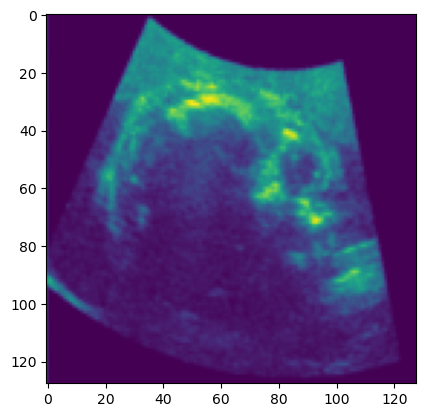

[ 0.e+00  1.e-01  5.e-03 -1.e+01 -1.e+01  6.e+00]


Error: no "view" rule for type "image/png" passed its test case
       (for more information, add "--debug=1" on the command line)


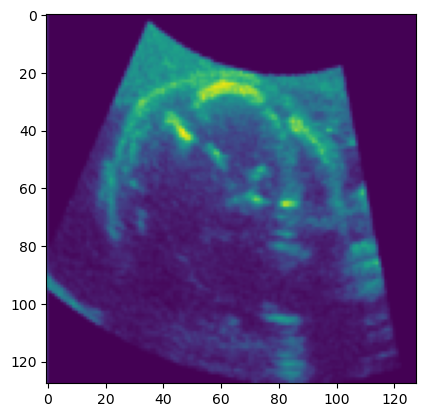

[ 0.e+00  1.e-01  3.e-03 -8.e+00 -1.e+01 -2.e+00]


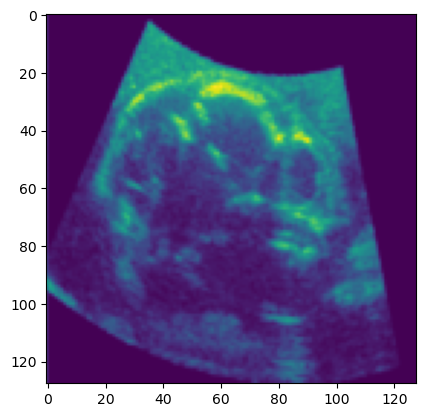

[  0.03   0.1    0.1   -6.   -10.     0.  ]


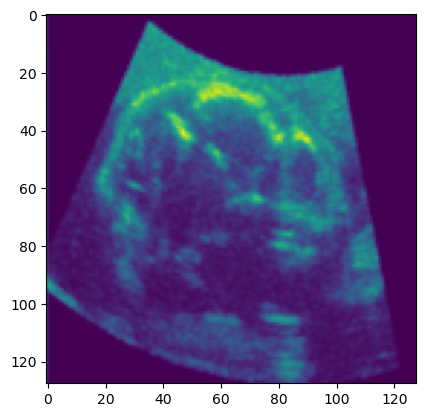

[ 2.e-03  1.e-01  5.e-03 -4.e+00 -1.e+01 -2.e+00]


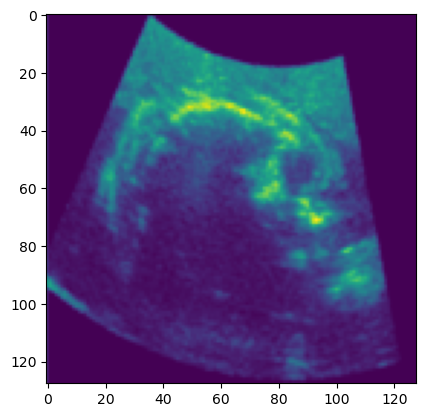

In [4]:

############3

"""

Script for evaluation for 3D Ultrasound dataset

dataset folder - dataset_Vol3, dataset_Vol3_2

"""

#############33


import json

from dataclasses import dataclass
from datasets import load_dataset
import matplotlib.pyplot as plt
from accelerate import Accelerator
from huggingface_hub import HfFolder, Repository, whoami
from tqdm.auto import tqdm
from pathlib import Path
import os
from diffusers import DDPMPipeline
import math
import os
from diffusers.optimization import get_cosine_schedule_with_warmup
import torch
from diffusers import UNet2DModel
from torchvision import transforms

from PIL import Image
import torch.nn.functional as F
from diffusers import DDPMScheduler
from torch.utils.data import DataLoader
import pandas as pd
from torch.utils.data import Dataset

import torchvision.transforms as T

import numpy as np

from test_gpu import setup_cuda
from torch import nn
from diffusers import UNet2DConditionModel

import random
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid






class ImageVectorDataset3DUSG(Dataset):
    def __init__(self, image_dir, label_csv, image_size=64):
        self.df = pd.read_csv(label_csv)
        self.image_dir = image_dir

        # Filter rows based on step from image filenames like image_0.png to image_359.png
        # self.df["index"] = self.df["filename"].str.extract(r"_(\d+)\.")[0].astype(int)
        # self.df = self.df[self.df["index"] % step == 0].reset_index(drop=True)

        # print(self.df)

        self.image_names = os.listdir(self.image_dir)
        print(len(self.image_names))

        self.df = self.df[self.df['filename'].isin(self.image_names)]
        print(self.df.shape)


        self.transform = T.Compose([
            T.Resize((image_size, image_size)),
            T.ToTensor(),
            T.Normalize([0.5], [0.5])
        ])



        print(self.df.shape)

        for col_name  in ["pos_x", "pos_y", "pos_z", "rot_x", "rot_y", "rot_z"]:
            # print(col_name)
            d = self.df[col_name].values
            d_u = np.unique(d)
            print(col_name, len(d_u), d_u)
            # diffs = np.diff(x)

            # diffs = np.diff(d_u)
            # if np.all(diffs ==diffs[0]) == True:
            #     # print(diffs)
            #     pass



    def preprocess(self):
        rot_x_get = np.unique(self.df["rot_x"].values)[::2]
        rot_y_get = np.unique(self.df["rot_y"].values)[::2]
        rot_z_get = np.unique(self.df["rot_z"].values)[::2]

        print(len(rot_x_get), rot_x_get)
        print(len(rot_y_get), rot_y_get)
        print(len(rot_z_get), rot_z_get)


        # for get in [rot_x_get, rot_y_get, rot_z_get]
        self.df = self.df[(self.df["rot_x"].isin(rot_x_get)) & (self.df["rot_y"].isin(rot_y_get)) & (self.df["rot_z"].isin(rot_z_get))]
        print("After preprocess ", self.df.shape)



    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):

        row = self.df.iloc[idx]

        image_path = os.path.join(self.image_dir, row['filename'])
        image = Image.open(image_path).convert("L")
        image = self.transform(image)

        vector = torch.tensor([row['pos_x'], row['pos_y'], row['pos_z'], row['rot_x'], row['rot_y'], row['rot_z']], dtype=torch.float32)
        return image, vector






class CustomConditionedUNet(nn.Module):
    def __init__(self, base_unet: UNet2DConditionModel, cond_dim=3, embedding_dim=128):
        super().__init__()
        self.unet = base_unet
        self.cond_embed = nn.Sequential(
            nn.Linear(cond_dim, embedding_dim),
            nn.SiLU(),
            nn.Linear(embedding_dim, embedding_dim)
        )

        self.config = self.unet.config



    def forward(self, sample, timestep, cond_vector=None):
        # [B, 128] -> [B, 1, 128] (cross-attention format)
        cond_emb = self.cond_embed(cond_vector).unsqueeze(1)
        return self.unet(
            sample=sample,
            timestep=timestep,
            encoder_hidden_states=cond_emb
        )



class ConditionedDDPMPipeline(DDPMPipeline):
    def __init__(self, unet, scheduler):
        super().__init__(unet=unet, scheduler=scheduler)

    @torch.no_grad()
    def __call__(self, cond_vector, batch_size=1, generator=None, num_inference_steps=1000):

        sample_shape = (batch_size, self.unet.config.in_channels, 128, 128)  # adapt to your model
        image = torch.randn(sample_shape, generator=generator).to("cuda")

        #print(cond_vector.size())

        self.scheduler.set_timesteps(num_inference_steps)
        for t in self.scheduler.timesteps:
            model_output = self.unet(
                sample=image,
                timestep=t,
                cond_vector=cond_vector.to("cuda")  # pass conditioning vector
            )
            image = self.scheduler.step(model_output.sample, t, image).prev_sample

        return image



def my_make_grid(images, rows, cols):
    # w, h = images[0,0,:,:].size
    # w=64
    # h=64
    # grid = Image.new("RGB", size=(cols * w, rows * h))
    # for i, image in enumerate(images):
    #     grid.paste(image, box=(i % cols * w, i // cols * h))
    # return grid

    grid = make_grid(images, nrow=4, padding=2, normalize=True)

    # Convert to RGB PIL image
    grid_pil = to_pil_image(grid)
    return grid_pil



def evaluate(epoch, pipeline, labels_list):
    # Sample some images from random noise (this is the backward diffusion process).
    # The default pipeline output type is `List[PIL.Image]`

    #c = random.sample(list(labels_list), 16)


    print(labels_list, labels_list.size())

    images = pipeline(
                    cond_vector=torch.tensor(labels_list, dtype = torch.float),
                    batch_size=labels_list.size()[0],
                    generator=torch.manual_seed(0)
                    )



    print(images.shape)
    print(torch.min(images[0]), torch.max(images[0]))
    print(torch.min((images[0]+1)/2), torch.max((images[0]+1)/2))

    # Make a grid out of the images
    image_grid = my_make_grid(images,rows=4, cols=4)
    image_grid.show()

    #Save the images
    # os.makedirs(test_dir, exist_ok=True)
    # image_grid.save(f"{SAVE_SHOW_RESULTS_PATH}/grid.png")
# 
    # save images 

    for i, c2 in enumerate(c):
        n = c2.cpu().detach().numpy()
        print(n)
        image = to_pil_image(((images[i]+1)/2))
        # image.save(f"{SAVE_SHOW_RESULTS_PATH}/image_{i}_{n[0]:.2f}_{n[1]:.2f}_{n[2]:.2f}_{n[3]:.2f}_{n[4]:.2f}_{n[5]:.2f}.png")

        plt.imshow(image)

        plt.show()





# setup_cuda(use_memory_fraction=0.1, num_threads=2, visible_devices="0,1", use_cuda_with_id = 0)


# base_unet = UNet2DConditionModel(
#     sample_size=64, in_channels=1, out_channels=1, layers_per_block=2,
#     block_out_channels=(64, 128, 256),  # now 4 blocks = 4 values
#     down_block_types=('DownBlock2D', 'AttnDownBlock2D',  'AttnDownBlock2D'),
#     up_block_types=('AttnUpBlock2D', 'AttnUpBlock2D',  'UpBlock2D'),
#     cross_attention_dim=128
# )


setup_cuda(use_memory_fraction=0.3, num_threads=4, visible_devices="0,1,2", use_cuda_with_id = 1)

base_unet = UNet2DConditionModel(
    sample_size=128, in_channels=1, out_channels=1, layers_per_block=2,
    block_out_channels=(64, 128, 256, 512),  # now 4 blocks = 4 values
    down_block_types=('DownBlock2D', 'DownBlock2D', 'AttnDownBlock2D',  'AttnDownBlock2D'),

    up_block_types=('AttnUpBlock2D', 'AttnUpBlock2D',  'UpBlock2D', 'UpBlock2D'),
    cross_attention_dim=128
)


model = CustomConditionedUNet(base_unet, cond_dim = 6).cuda()


RESULTS_PATH = "results_3d_usvol3_3_cont"
SAVE_SHOW_RESULTS_PATH = F"show_{RESULTS_PATH}"

with open(f'{RESULTS_PATH}/training_config.json') as f:
    training_config = json.load(f)
    print(training_config)
    print(training_config['dataset_dir'])



# dataset = ImageVectorDataset3DUSG(f"{training_config['dataset_dir']}/images", f"{training_config['dataset_dir']}/poses_unity.csv", 
#                                   image_size=training_config['image_size'])
# dataset.preprocess()

# train_dataloader = DataLoader(dataset, batch_size=8, shuffle=True)
# print(len(dataset))


# dfs = dataset.df.sample(64, random_state=0)
# c = torch.Tensor(dfs[training_config['cond_parameters']].values)

# print(c.size())


# noise_scheduler = DDPMScheduler(num_train_timesteps=1000)


# pipeline = ConditionedDDPMPipeline(
#                 unet=model,
#                 scheduler=noise_scheduler)



# model.load_state_dict(torch.load(f"model_{RESULTS_PATH}.pt", weights_only=True))

# evaluate(1, pipeline, c)




#
# 

RESULTS_PATH = "results_3d_usvol3_2_v3"

SAVE_SHOW_RESULTS_PATH = F"show_{RESULTS_PATH}_dataset_Vol3_3_random32"

if not os.path.exists(SAVE_SHOW_RESULTS_PATH):
    os.makedirs(SAVE_SHOW_RESULTS_PATH)


dataset_csv_path = "dataset_Vol3_3_random32/poses_unity.csv"
original_images_dir = "dataset_Vol3_3_random32/images"

df = pd.read_csv(dataset_csv_path)

img_list = os.listdir(original_images_dir)
# img_list


mask = df['filename'].isin(img_list)
df = df[mask]


# c =  torch. tensor(df. values[1:, :])

c =  torch.tensor(df.values[:, 1:].astype(np.float32))
# print(c)
# c = torch.Tensor(dfs[training_config['cond_parameters']].values)

# print(c.size())

c = torch.tensor([[  0.3,   0.1000,   0.2, -10.0000, -10.0000,  -2.0000],
        [  0.0000,   0.1000,   0.005, -10.0000, -10.0000,   6.0000],
        [  0.0000,   0.1000,   0.003,  -8.0000, -10.0000,  -2.0000],
        [  0.03,   0.1000,   0.1,  -6.0000, -10.0000,   0.0000],
        [  0.002,   0.1000,   0.005,  -4.0000, -10.0000,  -2.0000]])

print(c)

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)


pipeline = ConditionedDDPMPipeline(
                unet=model,
                scheduler=noise_scheduler)



model.load_state_dict(torch.load(f"model_{RESULTS_PATH}.pt", weights_only=True))

evaluate(1, pipeline, c)